In [243]:
import tensorflow as tf
tf.enable_eager_execution()
import matplotlib.pyplot as plt
import numpy as np
import random
from progressbar import progressbar
import cv2
import os
import time
import h5py
import sys
import functools
import pydot 
import graphviz

# Download the class repository
! git clone https://github.com/aamini/introtodeeplearning_labs.git  > /dev/null 2>&1
% cd introtodeeplearning_labs 
! git pull
% cd .. 

IM_SHAPE = (64, 64, 3)


class TrainingDatasetLoader(object):
    def __init__(self, data_path):

        print("Opening {}".format(data_path))
        sys.stdout.flush()

        self.cache = h5py.File(data_path, 'r')

        print("Loading data into memory...")
        sys.stdout.flush()
        self.images = self.cache['images'][:]
        self.labels = self.cache['labels'][:]
        self.image_dims = self.images.shape
        n_train_samples = self.image_dims[0]

        self.train_inds = np.random.permutation(np.arange(n_train_samples))

        self.pos_train_inds = self.train_inds[ self.labels[self.train_inds, 0] == 1.0 ]
        self.neg_train_inds = self.train_inds[ self.labels[self.train_inds, 0] != 1.0 ]

    def get_train_size(self):
        return self.train_inds.shape[0]

    def get_train_steps_per_epoch(self, batch_size, factor=10):
        return self.get_train_size()//factor//batch_size

    def get_batch(self, n, only_faces=False, p_pos=None, p_neg=None, return_inds=False):
        if only_faces:
            selected_inds = np.random.choice(self.pos_train_inds, size=n, replace=False, p=p_pos)
        else:
            selected_pos_inds = np.random.choice(self.pos_train_inds, size=n//2, replace=False, p=p_pos)
            selected_neg_inds = np.random.choice(self.neg_train_inds, size=n//2, replace=False, p=p_neg)
            selected_inds = np.concatenate((selected_pos_inds, selected_neg_inds))

        sorted_inds = np.sort(selected_inds)
        train_img = self.images[sorted_inds,:,:,::-1]/255.
        train_label = self.labels[sorted_inds,...]
        return (train_img, train_label, sorted_inds) if return_inds else (train_img, train_label)

    def get_n_most_prob_faces(self, prob, n):
        idx = np.argsort(prob)[::-1]
        most_prob_inds = self.pos_train_inds[idx[:10*n:10]]
        return self.images[most_prob_inds,...]/255.

    def get_all_train_faces(self):
        return self.images[ self.pos_train_inds ]



class PPBFaceEvaluator:
    ''' Evaluate on the PPB dataset'''
    def __init__(self, skip=4):

        path_to_faces = tf.keras.utils.get_file('ppb', 'https://www.dropbox.com/s/l0lp6qxeplumouf/PPB.tar?dl=1', extract=True)
        self.ppb_root = os.path.join(os.path.split(path_to_faces)[0], 'PPB-2017')

        ppb_anno = os.path.join(self.ppb_root,'PPB-2017-metadata.csv')

        self.anno_dict = {}
        with open('PPB-2017-metadata.csv') as f:
            for line in f.read().split('\n'):
                ind, name, gender, numeric, skin, country = line.split(',')
                self.anno_dict[name] = (gender.lower(),skin.lower())

        image_dir = os.path.abspath("imgs")
        image_files = sorted(os.listdir(image_dir))[::skip] #sample every 4 images for computation time in the lab

        self.raw_images = {
            'male_darker':[],
            'male_lighter':[],
            'female_darker':[],
            'female_lighter':[],
        }
        
        self.anno_dict.keys()
        
        for filename in image_files:
            if not filename.endswith(".jpg"):
                continue
            image = cv2.imread(os.path.join(image_dir,filename))[:,:,::-1]
            gender, skin = self.anno_dict[filename]
            self.raw_images[gender+'_'+skin].append(image)


    def get_sample_faces_from_demographic(self, gender, skin_color):
        key = self.__get_key(gender, skin_color)
        data = self.raw_images[key][50]/255.
        return data


    def evaluate(self, models_to_test, gender, skin_color, output_idx=None, from_logit=False, patch_stride=0.2, patch_depth=5):
        correct_predictions = [0.0]*len(models_to_test)

        key = self.__get_key(gender, skin_color)
        num_faces = len(self.raw_images[key])

        import progressbar
        bar = progressbar.ProgressBar()
        for face_idx in bar(range(num_faces)):

            image = self.raw_images[key][face_idx]
            height, width, _ = image.shape

            patches, bboxes = slide_square(image, patch_stride, width/2, width, patch_depth)
            patches = tf.cast(tf.constant(patches, dtype=tf.uint8), tf.float32)/255.

            for model_idx, model in enumerate(models_to_test):
                out = model(patches)
                y = out if output_idx is None else out[output_idx]
                y = y.numpy()
                y_inds = np.argsort(y.flatten())
                most_likely_prob = y[y_inds[-1]]
                if (from_logit and most_likely_prob >= 0.0) or \
                   (not from_logit and most_likely_prob >= 0.5):
                        correct_predictions[model_idx] += 1

        accuracy = [correct_predictions[i]/num_faces for i,_ in enumerate(models_to_test)]
        return accuracy


    def __get_key(self, gender, skin_color):
        gender = gender.lower()
        skin_color = skin_color.lower()
        assert gender in ['male', 'female']
        assert skin_color in ['lighter', 'darker']
        return '{}_{}'.format(gender, skin_color)



''' function to slide a square across image and extract square regions
img = the image
stride = (0,1], provides the fraction of the dimension for which to slide to generate a crop
max_size = maximum square size
min_size = minimum square size
n = number of different sizes including min_size, max_size '''
def slide_square(img, stride, min_size, max_size, n):
    img_h, img_w = img.shape[:2]

    square_sizes = np.linspace(min_size, max_size, n, dtype=np.int32)
    square_images = []
    square_bbox = [] # list of list of tuples: [(i1,j1), (i2,j2)] where i1,j1 is the top left corner; i2,j2 is bottom right corner
    # for each of the square_sizes
    for level, sq_dim in enumerate(square_sizes):

        stride_length = int(stride*sq_dim)
        stride_start_i = range(0,int(img_h-sq_dim+1),stride_length)
        stride_start_j = range(0,int(img_w-sq_dim+1),stride_length)
        for i in stride_start_i:
            for j in stride_start_j:
                square_top_left = (i,j)

                square_bottom_right = (i+sq_dim,j+sq_dim)

                square_corners = (square_top_left,square_bottom_right)
                square_corners_show = ((j,i),(j+sq_dim,i+sq_dim))
                square_image = img[i:i+sq_dim,j:j+sq_dim]

                square_resize = cv2.resize(square_image, IM_SHAPE[:2], interpolation=cv2.INTER_NEAREST)
                # append to list of images and bounding boxes

                square_images.append(square_resize)
                square_bbox.append(square_corners)

    return square_images, square_bbox


def custom_progress_text(message):
  import progressbar
  from string import Formatter

  message_ = message.replace('(', '{')
  message_ = message_.replace(')', '}')

  keys = [key[1] for key in Formatter().parse(message_)]

  ids = {}
  for key in keys:
    if key is not None:
      ids[key] = float('nan')

  msg = progressbar.FormatCustomText(message, ids)
  return msg

def create_progress_bar(text=None):
  import progressbar
  if text is None:
    text = progressbar.FormatCustomText('')
  bar = progressbar.ProgressBar(widgets=[
      progressbar.Percentage(),
      progressbar.Bar(),
      progressbar.AdaptiveETA(), '  ',
      text,
  ])
  return bar

def display_model(model):
  tf.keras.utils.plot_model(model,
             to_file='tmp.png',
             show_shapes=True)
  from IPython.display import Image
  return Image('tmp.png')


def plot_sample(x,y,vae):
    plt.figure(figsize=(2,1))
    plt.subplot(1, 2, 1)

    idx = np.where(y.numpy()==1)[0][0]
    plt.imshow(x[idx])
    plt.grid(False)

    plt.subplot(1, 2, 2)
    plt.imshow(vae(x)[idx])
    plt.grid(False)

    plt.show()


class LossHistory:
  def __init__(self, smoothing_factor=0.0):
    self.alpha = smoothing_factor
    self.loss = []
  def append(self, value):
    self.loss.append( self.alpha*self.loss[-1] + (1-self.alpha)*value if len(self.loss)>0 else value )
  def get(self):
    return self.loss

class PeriodicPlotter:
    def __init__(self, sec, xlabel='', ylabel='', scale=None):
        from IPython import display as ipythondisplay
        import matplotlib.pyplot as plt
        import time

        self.xlabel = xlabel
        self.ylabel = ylabel
        self.sec = sec
        self.scale = scale

        self.tic = time.time()

    def plot(self, data):
        if time.time() - self.tic > self.sec:
            plt.cla()
      
            if self.scale is None:
                plt.plot(data)
            elif self.scale == 'semilogx':
                plt.semilogx(data)
            elif self.scale == 'semilogy':
                plt.semilogy(data)
            elif self.scale == 'loglog':
                plt.loglog(data)
            else:
                raise ValueError("unrecognized parameter scale {}".format(self.scale))

            plt.xlabel(self.xlabel); plt.ylabel(self.ylabel)
            ipythondisplay.clear_output(wait=True)
            ipythondisplay.display(plt.gcf())

            self.tic = time.time()




/Users/arusnak/ML/MIT_DL/introtodeeplearning_labs
Already up to date.
/Users/arusnak/ML/MIT_DL


In [3]:
mnist = tf.keras.datasets.mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()
train_images = np.expand_dims(train_images, axis=-1)/255.
train_labels = np.int64(train_labels)
test_images = np.expand_dims(test_images, axis=-1)/255.
test_labels = np.int64(test_labels)

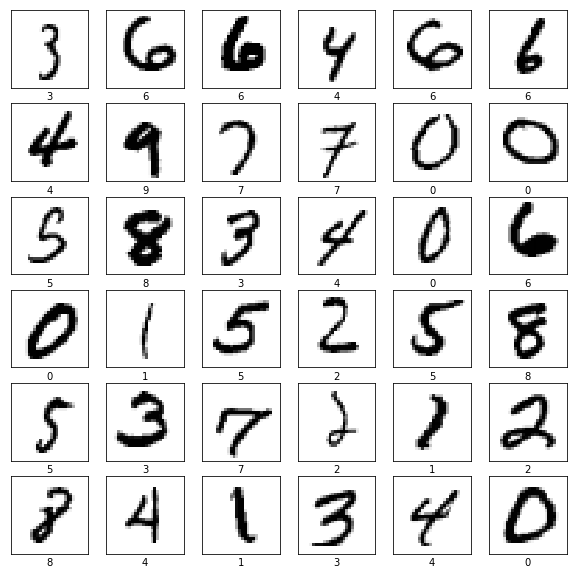

In [5]:
plt.figure(figsize=(10,10))
random_inds = np.random.choice(60000,36)
for i in range(36):
    plt.subplot(6,6, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    image_ind = random_inds[i]
    plt.imshow(np.squeeze(train_images[image_ind]), cmap=plt.cm.binary)
    plt.xlabel(train_labels[image_ind])

In [20]:
#classification using FC layers

def buildFCModel():
    fcModel= tf.keras.Sequential([
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation=tf.nn.relu),
        tf.keras.layers.Dense(128, activation=tf.nn.relu),
        tf.keras.layers.Dense(10, activation=tf.nn.softmax)
    ])
    return fcModel

model2 = buildFCModel()

In [21]:
model2.compile(optimizer=tf.train.GradientDescentOptimizer(learning_rate=1e-1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [22]:
batch_size = 64
epochs = 10
model2.fit(train_images, train_labels, batch_size=batch_size, epochs=epochs)

Epoch 1/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.3483 - acc: 0.8986
Epoch 2/10
60000/60000 [==============================] - 1s 23us/sample - loss: 0.1572 - acc: 0.9535
Epoch 3/10
60000/60000 [==============================] - 2s 29us/sample - loss: 0.1108 - acc: 0.9671
Epoch 4/10
60000/60000 [==============================] - 2s 29us/sample - loss: 0.0858 - acc: 0.9747
Epoch 5/10
60000/60000 [==============================] - 2s 26us/sample - loss: 0.0709 - acc: 0.9789
Epoch 6/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.0581 - acc: 0.9828
Epoch 7/10
60000/60000 [==============================] - 2s 28us/sample - loss: 0.0487 - acc: 0.9854
Epoch 8/10
60000/60000 [==============================] - 2s 28us/sample - loss: 0.0421 - acc: 0.9872
Epoch 9/10
60000/60000 [==============================] - 2s 29us/sample - loss: 0.0357 - acc: 0.9890
Epoch 10/10
60000/60000 [==============================] - 2s 26us/sample - loss: 

In [19]:
test_loss, test_acc = model.evaluate(test_images, test_labels)
print(test_acc)

10000/10000 [==============================] - 0s 32us/sample - loss: 0.0905 - acc: 0.9810
0.981


In [23]:
test_loss, test_acc = model2.evaluate(test_images, test_labels)
print(test_acc)

10000/10000 [==============================] - 0s 32us/sample - loss: 0.0753 - acc: 0.9758
0.9758


In [26]:
#using a CNN model

def buildCNNModel():
    cnn_model = tf.keras.Sequential([
        tf.keras.layers.Conv2D(filters=24, kernel_size=(3,3), input_shape=(28,28,1), activation=tf.nn.relu),
        tf.keras.layers.MaxPool2D(pool_size=(2,2)),
        tf.keras.layers.Conv2D(filters=36, kernel_size=(3,3), activation=tf.nn.relu),
        tf.keras.layers.MaxPool2D(pool_size=(2,2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation=tf.nn.relu),
        tf.keras.layers.Dense(10, activation=tf.nn.softmax)
    ])
    return cnn_model

CNNmodel = buildCNNModel()
print(CNNmodel.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 26, 26, 24)        240       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 13, 13, 24)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 11, 11, 36)        7812      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 5, 5, 36)          0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 900)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 128)               115328    
_________________________________________________________________
dense_9 (Dense)              (None, 10)                1290      
Total para

In [27]:
CNNmodel.compile(optimizer=tf.train.GradientDescentOptimizer(learning_rate=1e-1), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [28]:
CNNmodel.fit(train_images, train_labels, batch_size=batch_size, epochs=epochs)

Epoch 1/10
60000/60000 [==============================] - 19s 309us/sample - loss: 0.2427 - acc: 0.9268
Epoch 2/10
60000/60000 [==============================] - 18s 300us/sample - loss: 0.0685 - acc: 0.9788
Epoch 3/10
60000/60000 [==============================] - 17s 291us/sample - loss: 0.0485 - acc: 0.9851
Epoch 4/10
60000/60000 [==============================] - 18s 293us/sample - loss: 0.0378 - acc: 0.9881
Epoch 5/10
60000/60000 [==============================] - 18s 294us/sample - loss: 0.0306 - acc: 0.9901
Epoch 6/10
60000/60000 [==============================] - 18s 294us/sample - loss: 0.0256 - acc: 0.9913
Epoch 7/10
60000/60000 [==============================] - 18s 293us/sample - loss: 0.0214 - acc: 0.9934
Epoch 8/10
60000/60000 [==============================] - 18s 296us/sample - loss: 0.0165 - acc: 0.9952
Epoch 9/10
60000/60000 [==============================] - 18s 294us/sample - loss: 0.0145 - acc: 0.9954
Epoch 10/10
60000/60000 [==============================] - 18s 2

In [29]:
test_loss, test_acc = CNNmodel.evaluate(test_images, test_labels)
print(test_acc)

10000/10000 [==============================] - 1s 101us/sample - loss: 0.0337 - acc: 0.9890
0.989


In [31]:
predictions = CNNmodel.predict(test_images)

In [35]:
predictions[5]

array([8.9184775e-09, 9.9997556e-01, 4.1201357e-08, 1.1303422e-12,
       1.9903195e-05, 1.1821937e-12, 2.1410580e-10, 4.5098113e-06,
       2.9189009e-08, 9.8799351e-09], dtype=float32)

In [36]:
np.argmax(predictions[5]) 

1

In [37]:
test_labels[5]

1

In [43]:
def plotImage(i, predictionsArr, trueLabel, img):
    predArr, tLabel, img = predictionsArr[i], trueLabel[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    
    plt.imshow(np.squeeze(img), cmap = plt.cm.binary)
    predictedLabel = np.argmax(predArr)
    if predictedLabel == tLabel:
        color = 'blue'
    else:
        color= 'red'
        
    plt.xlabel("{} {:2.0f}% ({})".format(predictedLabel, 100*np.max(predArr), tLabel, color=color))
    
def plotValueArray(i, predictionsArray, trueLabel):
    predArr, tLabel = predictionsArray[i], trueLabel[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    thisplot = plt.bar(range(10), predArr, color="#777777")
    plt.ylim([0,1])
    predictedLabel = np.argmax(predArr)
    
    thisplot[predictedLabel].set_color('red')
    thisplot[tLabel].set_color('blue')

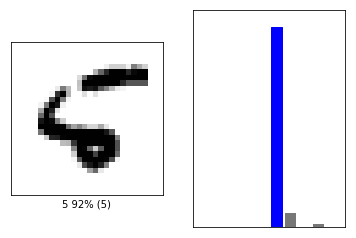

In [44]:
image_index = 8 #@param {type:"slider", min:0, max:100, step:1}
plt.subplot(1,2,1)
plotImage(image_index, predictions, test_labels, test_images)
plt.subplot(1,2,2)
plotValueArray(image_index, predictions,  test_labels)


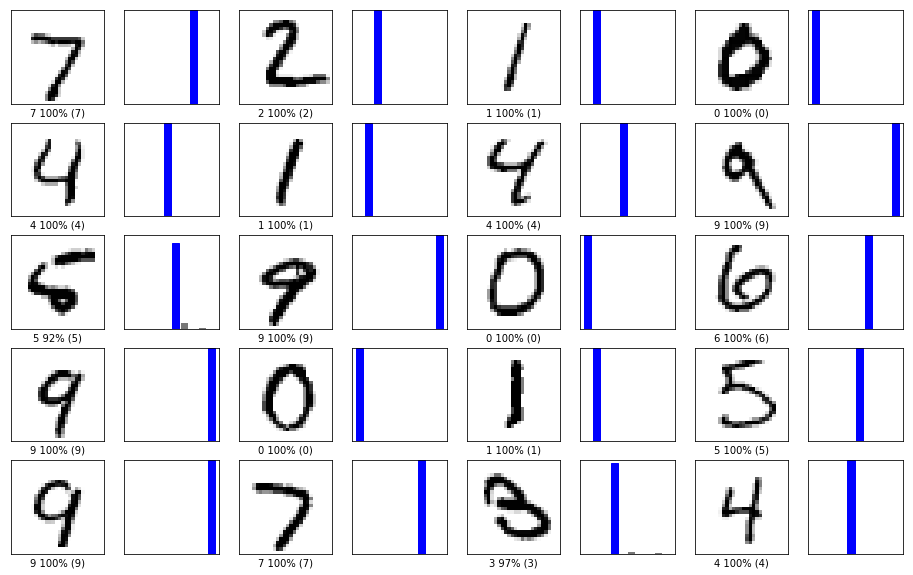

In [46]:
num_rows = 5
num_cols = 4
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plotImage(i, predictions, test_labels, test_images)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plotValueArray(i, predictions, test_labels)


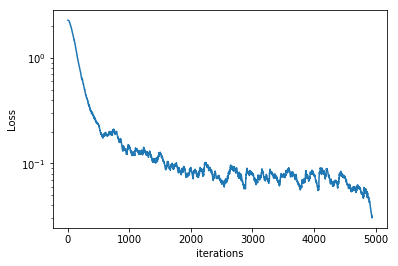

100%|#########################################################|Time:  0:00:58  


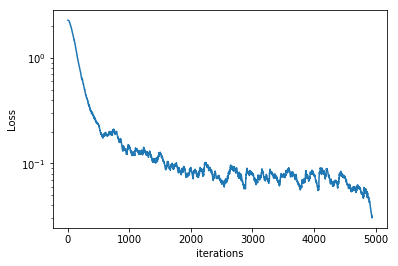

In [55]:
#training the model with gradient tape 
from IPython import display as ipythondisplay

cnnModel2 = buildCNNModel()

batch_size=12
loss_history = LossHistory(smoothing_factor=0.99)
plotter = PeriodicPlotter(sec=2, xlabel='iterations', ylabel='Loss', scale='semilogy')
optimizer = tf.train.GradientDescentOptimizer(learning_rate=1e-2)
bar = create_progress_bar()

for idx in bar(range(0, train_images.shape[0], batch_size)):
    (images, labels) = (train_images[idx:idx+batch_size], train_labels[idx:idx+batch_size])
    images = tf.convert_to_tensor(images, dtype=tf.float32)
    with tf.GradientTape() as tape:
        logits = cnnModel2(images)
        loss_value = tf.keras.backend.sparse_categorical_crossentropy(labels, logits)
    loss_history.append(loss_value.numpy().mean())
    plotter.plot(loss_history.get())
    #backprop
    grads = tape.gradient(loss_value, cnnModel2.variables)
    optimizer.apply_gradients(zip(grads, cnnModel2.variables), global_step=tf.train.get_or_create_global_step())
                        

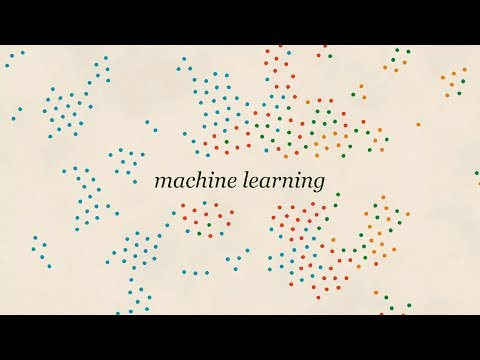

In [56]:
#debiasing
from IPython.display import YouTubeVideo
YouTubeVideo('59bMh59JQDo')

In [57]:
import pdb

In [58]:
path_to_training_data = tf.keras.utils.get_file('train_face.h5', 'https://www.dropbox.com/s/l5iqduhe0gwxumq/train_face.h5?dl=1')
loader = TrainingDatasetLoader(path_to_training_data)

1263894528/1263889489 [==============================] - 191s 0us/step
Opening /Users/arusnak/.keras/datasets/train_face.h5
Loading data into memory...


In [59]:
number_of_training_examples = loader.get_train_size()
(images, labels) = loader.get_batch(100)

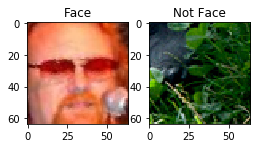

In [60]:

#@title Change the sliders to look at positive and negative training examples! { run: "auto" }

face_images = images[np.where(labels==1)[0]]
not_face_images = images[np.where(labels==0)[0]]

idx_face = 20 #@param {type:"slider", min:0, max:50, step:1}
idx_not_face = 11 #@param {type:"slider", min:0, max:50, step:1}

plt.figure(figsize=(4,2))
plt.subplot(1, 2, 1)
plt.imshow(face_images[idx_face])
plt.title("Face")
plt.grid(False)

plt.subplot(1, 2, 2)
plt.imshow(not_face_images[idx_not_face])
plt.title("Not Face")
plt.grid(False)

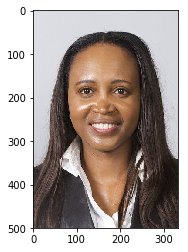

In [121]:
ppb = PPBFaceEvaluator() # create the dataset handler

gender = "female" #@param ["male", "female"]
skin_color = "darker" #@param ["lighter", "darker"]

img = ppb.get_sample_faces_from_demographic(gender, skin_color)
plt.imshow(img)
plt.grid(False)

In [125]:
#define initial model 

n_ouputs = 1
n_filters = 12

def makeStandardCLF():
    Conv2D = functools.partial(tf.keras.layers.Conv2D, padding='same', activation='relu')
    BatchNormalization = tf.keras.layers.BatchNormalization
    Flatten = tf.keras.layers.Flatten
    Dense = functools.partial(tf.keras.layers.Dense, activation='relu')
    
    model = tf.keras.Sequential([
        Conv2D(filters=1*n_filters, kernel_size=[5,5], strides=[2,2], input_shape=(64,64,3)),
        BatchNormalization(),
        Conv2D(filters=2*n_filters, kernel_size=[5,5], strides=[2,2]),
        BatchNormalization(),
        Conv2D(filters=4*n_filters, kernel_size=[5,5], strides=[2,2]),
        BatchNormalization(),
        Conv2D(filters=6*n_filters, kernel_size=[5,5], strides=[1,1]),
        BatchNormalization(),
        Flatten(),
        Dense(1, activation=None),
        tf.keras.layers.Dropout(0.5)
    ])
    return model

sCLF = makeStandardCLF()

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


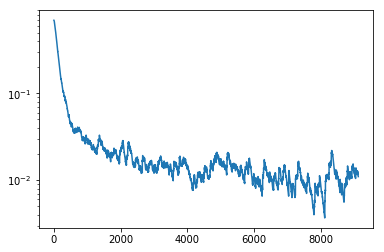

100%|#####################################|Time:  0:00:27  Epoch: 29 Loss: 0.09


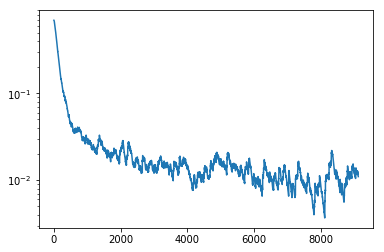

In [129]:
batch_size = 36
epochs = 30
learning_rate = 1e-3

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
loss_history = LossHistory(smoothing_factor=0.99)
plotter = PeriodicPlotter(sec=2, scale='semilogy')

for epoch in range(epochs):
    custom_msg = custom_progress_text("Epoch: %(epoch).0f Loss: %(loss)2.2f")
    bar = create_progress_bar(custom_msg)
    
    for idx in bar(range(loader.get_train_steps_per_epoch(batch_size))):
        #convert training data to tensors
        x, y = loader.get_batch(batch_size)
        x = tf.convert_to_tensor(x, dtype=tf.float32)
        y = tf.convert_to_tensor(y, dtype=tf.float32)
        
        with tf.GradientTape() as tape:
            logits = sCLF(x)
            loss_value = tf.nn.sigmoid_cross_entropy_with_logits(labels=y, logits=logits)
            
        custom_msg.update_mapping(epoch=epoch, loss=loss_value.numpy().mean())
        #backprop 
        grads = tape.gradient(loss_value, sCLF.variables)
        optimizer.apply_gradients(zip(grads, sCLF.variables), global_step= tf.train.get_or_create_global_step())
        
        loss_history.append(loss_value.numpy().mean())
        plotter.plot(loss_history.get())

In [132]:
(batch_x, batch_y) = loader.get_batch(5000)
y_pred_standard = tf.round(tf.nn.sigmoid(sCLF.predict(batch_x)))
acc_standard = tf.reduce_mean(tf.cast(tf.equal(batch_y, y_pred_standard), tf.float32))
print("Standard CNN accuracy on (potentially biased) training set: {:.4f}".format(acc_standard.numpy()))

Standard CNN accuracy on (potentially biased) training set: 0.9986


In [137]:
standard_cnn_accuracy = []
for skin_color in ['lighter', 'darker']:
  for gender in ['male', 'female']:
    standard_cnn_accuracy.append( ppb.evaluate([sCLF], gender, skin_color, from_logit=True)[0] )
    print("{} {}: {}".format(gender, skin_color, standard_cnn_accuracy[-1]))

100% (97 of 97) |########################| Elapsed Time: 0:01:03 Time:  0:01:03
N/A% (0 of 72) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

male lighter: 0.7319587628865979


100% (72 of 72) |########################| Elapsed Time: 0:00:45 Time:  0:00:45
N/A% (0 of 78) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

female lighter: 0.7916666666666666


100% (78 of 78) |########################| Elapsed Time: 0:00:48 Time:  0:00:48
N/A% (0 of 71) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

male darker: 0.7435897435897436


100% (71 of 71) |########################| Elapsed Time: 0:00:43 Time:  0:00:43


female darker: 0.7323943661971831


Text(0,0.5,'Accuracy')

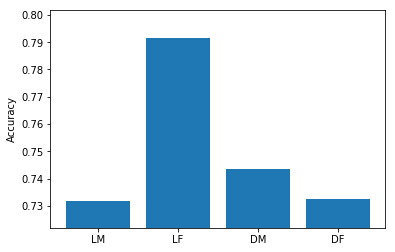

In [138]:
plt.bar(range(4), standard_cnn_accuracy)
plt.xticks(range(4), ('LM', 'LF', 'DM', 'DF'))
plt.ylim(np.min(standard_cnn_accuracy)-0.01,np.max(standard_cnn_accuracy)+0.01)
plt.ylabel('Accuracy')

In [212]:
#using a variational autoencoder to debias (learns latent features and edge cases better)

#function to calculate a VAE loss given an input x, reconstructed output x_pred, encoded mean mu, 
#encoded log of st. dev logsigma, and weight parameter for the latent loss

def vae_loss_function(x, x_pred, mu, logsigma, kl_weight=0.0005):
    latent_loss = 0.5 * tf.reduce_sum(tf.exp(logsigma) + tf.square(mu) - 1.0 - logsigma, axis=1)
    reconstruction_loss = tf.reduce_mean((x-x_pred)**2, axis=(1,2,3))
    vae_loss = kl_weight * latent_loss + reconstruction_loss
    return vae_loss

#reparameterization

def sampling(args):
    z_mean, z_logsigma = args
    batch = z_mean.shape[0]
    dim = z_mean.shape[1]
    
    epsilon = tf.random_normal(shape=tf.shape(z_mean))
    return z_mean + tf.math.exp(0.5 * z_logsigma) * epsilon

In [160]:
def debiasing_loss_function(x, x_pred, y, y_logit, mu, logsigma):
    vae_loss = vae_loss_function(x, x_pred, mu, logsigma)
    
    classification_loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=y, logits=y_logit)
    
    face_mask = tf.cast(tf.equal(y, 1), tf.float32)
    
    total_loss = tf.reduce_mean(classification_loss + face_mask * vae_loss)
    
    return total_loss, classification_loss

In [213]:
latent_dim = 100

In [217]:
def make_encoder_network():
    Conv2D = functools.partial(tf.keras.layers.Conv2D, padding='same', activation='relu')
    BatchNorm = tf.keras.layers.BatchNormalization
    Flatten = tf.keras.layers.Flatten
    Dense = functools.partial(tf.keras.layers.Dense, activation='relu')
    inputs = tf.keras.layers.Input(shape=(64,64,3))
    
    hidden = Conv2D(filters=1*n_filters, kernel_size=[5,5], strides=[2,2])(inputs)
    hidden = BatchNorm()(hidden)
    
    hidden = Conv2D(filters=2*n_filters, kernel_size=[5,5], strides=[2,2])(hidden)
    hidden = BatchNorm()(hidden)
    
    hidden = Conv2D(filters=4*n_filters, kernel_size=[3,3], strides=[2,2])(hidden)
    hidden = BatchNorm()(hidden)
    
    hidden = Conv2D(filters=6*n_filters, kernel_size=[3,3], strides=[1,1])(hidden)
    hidden = BatchNorm()(hidden)
    
    hidden = Flatten(name='flatten')(hidden)
    
    #outputs of encoder 
    y_logit = Dense(1, activation=None, name='y_logit')(hidden)
    z_mean = Dense(latent_dim, name='z_mean')(hidden)
    z_logsigma = Dense(latent_dim, name='z_logsigma')(hidden)

    # use reparameterization trick to sample from the latent space
    z = tf.keras.layers.Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_logsigma])
    
    outputs = [y_logit, z_mean, z_logsigma, z]
    
    encoder = tf.keras.Model(inputs=inputs, outputs=outputs, name='encoder')
    
    flatten_layer_idx = encoder.layers.index(encoder.get_layer('flatten'))
    pre_flatten_shape = encoder.layers[flatten_layer_idx-1].get_output_at(0).shape[1:]
    
    return encoder, inputs, outputs, pre_flatten_shape

In [218]:
def make_decoder_network(pre_flatten_shape):
    Conv2DTranspose = functools.partial(tf.keras.layers.Conv2DTranspose, padding='same', activation='relu')
    BatchNorm = tf.keras.layers.BatchNormalization
    Flatten = tf.keras.layers.Flatten
    Dense = functools.partial(tf.keras.layers.Dense, activation='relu')
    
    latent_inputs = tf.keras.Input(shape=(latent_dim,))
    
    hidden = Dense(tf.reduce_prod(pre_flatten_shape))(latent_inputs)
    hidden = tf.keras.layers.Reshape(pre_flatten_shape)(hidden)
    
    #deconvolutional layers
    hidden = Conv2DTranspose(filters=4*n_filters, kernel_size=[3,3], strides=[1,1])(hidden)
    hidden = BatchNorm()(hidden)
    
    hidden = Conv2DTranspose(filters=2*n_filters, kernel_size=[3,3], strides=[2,2])(hidden)
    hidden = BatchNorm()(hidden)
    
    hidden = Conv2DTranspose(filters=1*n_filters, kernel_size=[5,5], strides=[2,2])(hidden)
    hidden = BatchNorm()(hidden)
    
    x_hat = Conv2DTranspose(filters=3, kernel_size=[5,5], strides=[2,2])(hidden)
    decoder = tf.keras.Model(inputs=latent_inputs, outputs=x_hat, name='decoder')
    return decoder

In [219]:
encoder, inputs, outputs, pre_flatten_shape = make_encoder_network()
decoder = make_decoder_network(pre_flatten_shape)

encoder_output = encoder(inputs)
y_logit, z_mean, z_logsigma, z = encoder_output
reconstructed_inputs = decoder(z)

vae = tf.keras.Model(inputs, reconstructed_inputs)

In [255]:
#for returning means of an image batch
def get_latent_mu(images, encoder, batch_size=1024):
    N = images.shape[0]
    mu = np.zeros((N, latent_dim))
    for start_ind in range(0, N, batch_size):
        end_ind = min(start_ind+batch_size, N+1)
        batch = images[start_ind:end_ind]
        batch = tf.convert_to_tensor(batch, dtype=tf.float32)/255.
        _, batch_mu, _, _ = encoder(batch)
        mu[start_ind:end_ind] = batch_mu
    return mu 

In [258]:
#recomputes sampling probabilities for a batch based on their rarity
def get_training_sample_probabilities(images, encoder, bins=10, smoothing_fac=0.0):
    print("recomputing sampling probs")
    mu = get_latent_mu(images, encoder)
    training_sample_p = np.zeros(mu.shape[0])
    
    for i in range(latent_dim):
        latent_distribution = mu[:,i]
        #histogram of latent dist
        hist_density, bin_edges = np.histogram(latent_distribution, density=True, bins=bins)
        bin_edges[0] = -float('inf')
        bin_edges[-1] = float('inf')
        
        #find which bin each sample falls into
        bin_idx = np.digitize(latent_distribution, bin_edges)
        
        hist_smoothed_density = hist_density + smoothing_fac
        hist_smoothed_density = hist_smoothed_density/ np.sum(hist_smoothed_density)
        
        #invert density function to create the sampling prob
        p = 1.0/(hist_smoothed_density[bin_idx-1])
        p = p / np.sum(p)
        
        training_sample_p = np.maximum(p, training_sample_p)
    training_sample_p /= np.sum(training_sample_p)
    
    return training_sample_p

recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

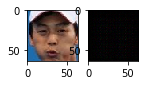

  3%|      |ETA:   0:08:50  Epoch: 0   Iter: 99   Class Loss: 0.34   Loss: 0.37

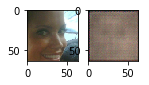

  6%|     |ETA:   0:08:17  Epoch: 0   Iter: 199   Class Loss: 0.01   Loss: 0.05

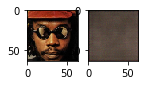

  9%|     |ETA:   0:08:24  Epoch: 0   Iter: 299   Class Loss: 0.23   Loss: 0.26Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


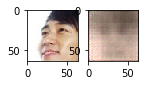

 13%|     |ETA:   0:08:09  Epoch: 0   Iter: 399   Class Loss: 0.01   Loss: 0.04

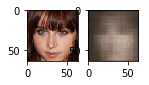

 16%|     |ETA:   0:07:42  Epoch: 0   Iter: 499   Class Loss: 0.05   Loss: 0.07

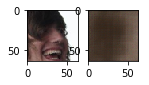

 19%|     |ETA:   0:07:33  Epoch: 0   Iter: 599   Class Loss: 0.14   Loss: 0.16Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


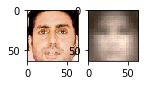

 22%|#    |ETA:   0:07:24  Epoch: 0   Iter: 699   Class Loss: 0.02   Loss: 0.05

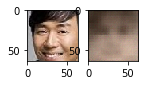

 26%|#    |ETA:   0:07:51  Epoch: 0   Iter: 799   Class Loss: 0.21   Loss: 0.24Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


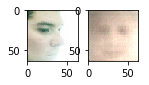

 29%|#    |ETA:   0:06:04  Epoch: 0   Iter: 899   Class Loss: 0.02   Loss: 0.05Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


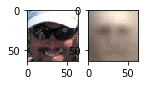

 32%|#    |ETA:   0:08:42  Epoch: 0   Iter: 999   Class Loss: 0.04   Loss: 0.07Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


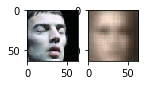

 36%|#   |ETA:   0:06:15  Epoch: 0   Iter: 1099   Class Loss: 0.01   Loss: 0.03

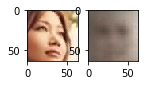

 39%|#   |ETA:   0:05:25  Epoch: 0   Iter: 1199   Class Loss: 0.00   Loss: 0.03

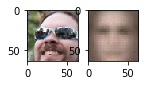

 42%|#   |ETA:   0:05:00  Epoch: 0   Iter: 1299   Class Loss: 0.07   Loss: 0.10Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


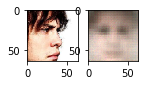

 45%|#   |ETA:   0:05:15  Epoch: 0   Iter: 1399   Class Loss: 0.09   Loss: 0.11Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


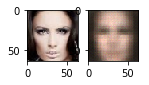

 49%|#   |ETA:   0:05:32  Epoch: 0   Iter: 1499   Class Loss: 0.03   Loss: 0.06

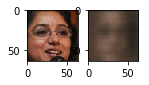

 52%|##  |ETA:   0:04:50  Epoch: 0   Iter: 1599   Class Loss: 0.02   Loss: 0.05Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


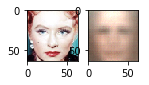

 55%|##  |ETA:   0:04:21  Epoch: 0   Iter: 1699   Class Loss: 0.14   Loss: 0.17

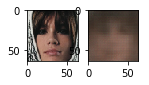

 58%|##  |ETA:   0:04:01  Epoch: 0   Iter: 1799   Class Loss: 0.02   Loss: 0.05

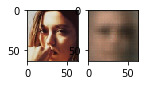

 62%|##  |ETA:   0:03:50  Epoch: 0   Iter: 1899   Class Loss: 0.02   Loss: 0.05

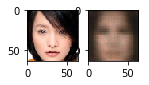

 65%|##  |ETA:   0:03:55  Epoch: 0   Iter: 1999   Class Loss: 0.00   Loss: 0.03

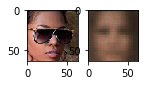

 68%|##  |ETA:   0:03:07  Epoch: 0   Iter: 2099   Class Loss: 0.01   Loss: 0.04

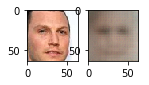

 72%|##  |ETA:   0:02:49  Epoch: 0   Iter: 2199   Class Loss: 0.01   Loss: 0.04

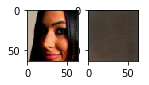

 75%|### |ETA:   0:02:25  Epoch: 0   Iter: 2299   Class Loss: 0.00   Loss: 0.03

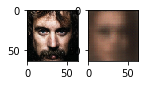

 78%|### |ETA:   0:01:59  Epoch: 0   Iter: 2399   Class Loss: 0.00   Loss: 0.03

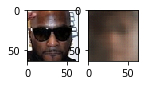

 81%|### |ETA:   0:01:38  Epoch: 0   Iter: 2499   Class Loss: 0.00   Loss: 0.03

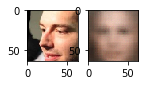

 85%|### |ETA:   0:01:23  Epoch: 0   Iter: 2599   Class Loss: 0.02   Loss: 0.04Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


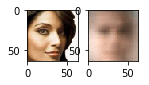

 88%|### |ETA:   0:01:08  Epoch: 0   Iter: 2699   Class Loss: 0.05   Loss: 0.08

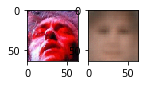

 91%|### |ETA:   0:00:54  Epoch: 0   Iter: 2799   Class Loss: 0.00   Loss: 0.03

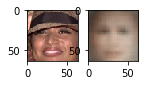

 94%|### |ETA:   0:00:29  Epoch: 0   Iter: 2899   Class Loss: 0.00   Loss: 0.03

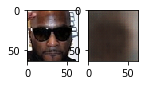

 98%|### |ETA:   0:00:11  Epoch: 0   Iter: 2999   Class Loss: 0.00   Loss: 0.03

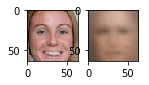

100%|####|Time:  0:09:55  Epoch: 0   Iter: 3052   Class Loss: 0.01   Loss: 0.03


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


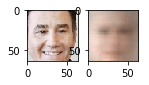

  3%|      |ETA:   0:10:06  Epoch: 1   Iter: 99   Class Loss: 0.00   Loss: 0.03

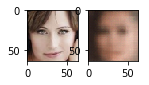

  6%|     |ETA:   0:12:01  Epoch: 1   Iter: 199   Class Loss: 0.00   Loss: 0.02

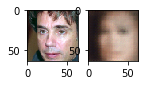

  9%|     |ETA:   0:10:41  Epoch: 1   Iter: 299   Class Loss: 0.00   Loss: 0.02

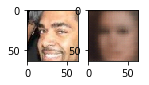

 13%|     |ETA:   0:08:16  Epoch: 1   Iter: 399   Class Loss: 0.01   Loss: 0.04

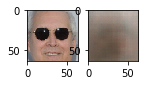

 16%|     |ETA:   0:07:44  Epoch: 1   Iter: 499   Class Loss: 0.00   Loss: 0.02

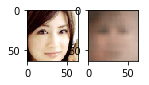

 19%|     |ETA:   0:09:27  Epoch: 1   Iter: 599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


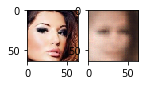

 22%|#    |ETA:   0:07:56  Epoch: 1   Iter: 699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


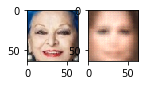

 26%|#    |ETA:   0:06:56  Epoch: 1   Iter: 799   Class Loss: 0.00   Loss: 0.02

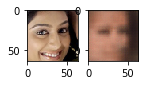

 29%|#    |ETA:   0:05:46  Epoch: 1   Iter: 899   Class Loss: 0.00   Loss: 0.03

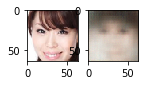

 32%|#    |ETA:   0:05:56  Epoch: 1   Iter: 999   Class Loss: 0.00   Loss: 0.02

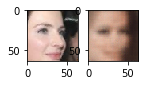

 36%|#   |ETA:   0:05:39  Epoch: 1   Iter: 1099   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


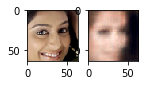

 39%|#   |ETA:   0:05:27  Epoch: 1   Iter: 1199   Class Loss: 0.00   Loss: 0.03

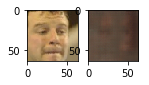

 42%|#   |ETA:   0:05:00  Epoch: 1   Iter: 1299   Class Loss: 0.00   Loss: 0.03

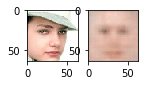

 45%|#   |ETA:   0:04:40  Epoch: 1   Iter: 1399   Class Loss: 0.00   Loss: 0.02

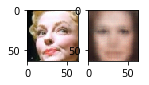

 49%|#   |ETA:   0:04:36  Epoch: 1   Iter: 1499   Class Loss: 0.00   Loss: 0.02

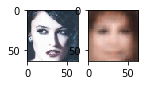

 52%|##  |ETA:   0:04:09  Epoch: 1   Iter: 1599   Class Loss: 0.00   Loss: 0.02

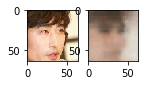

 55%|##  |ETA:   0:03:47  Epoch: 1   Iter: 1699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


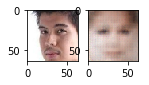

 58%|##  |ETA:   0:03:35  Epoch: 1   Iter: 1799   Class Loss: 0.00   Loss: 0.03

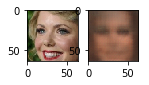

 62%|##  |ETA:   0:03:26  Epoch: 1   Iter: 1899   Class Loss: 0.00   Loss: 0.03

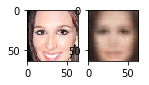

 65%|##  |ETA:   0:03:01  Epoch: 1   Iter: 1999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


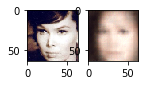

 68%|##  |ETA:   0:02:42  Epoch: 1   Iter: 2099   Class Loss: 0.14   Loss: 0.16

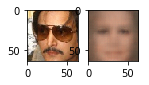

 72%|##  |ETA:   0:02:31  Epoch: 1   Iter: 2199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


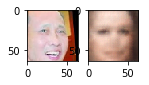

 75%|### |ETA:   0:02:10  Epoch: 1   Iter: 2299   Class Loss: 0.01   Loss: 0.03

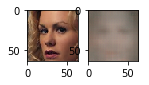

 78%|### |ETA:   0:01:48  Epoch: 1   Iter: 2399   Class Loss: 0.00   Loss: 0.02

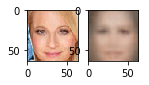

 81%|### |ETA:   0:01:35  Epoch: 1   Iter: 2499   Class Loss: 0.00   Loss: 0.02

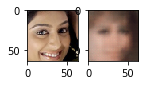

 85%|### |ETA:   0:01:15  Epoch: 1   Iter: 2599   Class Loss: 0.00   Loss: 0.03

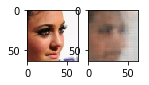

 88%|### |ETA:   0:01:00  Epoch: 1   Iter: 2699   Class Loss: 0.00   Loss: 0.03

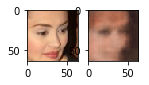

 91%|### |ETA:   0:00:42  Epoch: 1   Iter: 2799   Class Loss: 0.00   Loss: 0.02

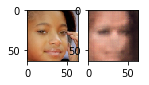

 94%|### |ETA:   0:00:25  Epoch: 1   Iter: 2899   Class Loss: 0.00   Loss: 0.02

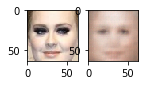

 98%|### |ETA:   0:00:08  Epoch: 1   Iter: 2999   Class Loss: 0.00   Loss: 0.03

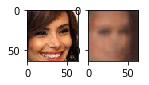

100%|####|Time:  0:09:13  Epoch: 1   Iter: 3052   Class Loss: 0.00   Loss: 0.03


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


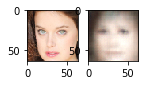

  3%|      |ETA:   0:08:17  Epoch: 2   Iter: 99   Class Loss: 0.01   Loss: 0.04Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


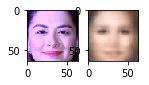

  6%|     |ETA:   0:08:27  Epoch: 2   Iter: 199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


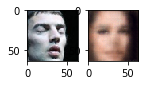

  9%|     |ETA:   0:07:39  Epoch: 2   Iter: 299   Class Loss: 0.00   Loss: 0.03

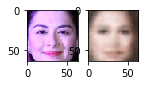

 13%|     |ETA:   0:07:32  Epoch: 2   Iter: 399   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


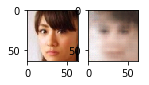

 16%|     |ETA:   0:07:29  Epoch: 2   Iter: 499   Class Loss: 0.00   Loss: 0.03

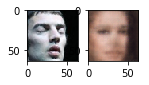

 19%|     |ETA:   0:06:50  Epoch: 2   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


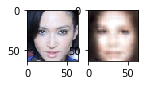

 22%|#    |ETA:   0:06:37  Epoch: 2   Iter: 699   Class Loss: 0.00   Loss: 0.03

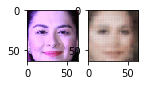

 26%|#    |ETA:   0:06:38  Epoch: 2   Iter: 799   Class Loss: 0.02   Loss: 0.04

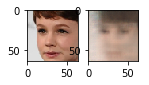

 29%|#    |ETA:   0:05:55  Epoch: 2   Iter: 899   Class Loss: 0.00   Loss: 0.03

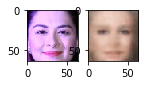

 32%|#    |ETA:   0:05:41  Epoch: 2   Iter: 999   Class Loss: 0.01   Loss: 0.04

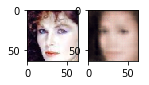

 36%|#   |ETA:   0:05:31  Epoch: 2   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


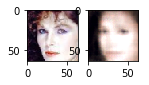

 39%|#   |ETA:   0:05:13  Epoch: 2   Iter: 1199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


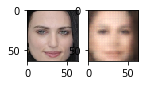

 42%|#   |ETA:   0:04:55  Epoch: 2   Iter: 1299   Class Loss: 0.00   Loss: 0.03

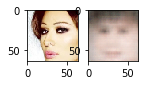

 45%|#   |ETA:   0:04:59  Epoch: 2   Iter: 1399   Class Loss: 0.00   Loss: 0.03

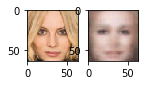

 49%|#   |ETA:   0:04:28  Epoch: 2   Iter: 1499   Class Loss: 0.01   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


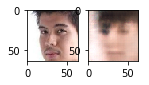

 52%|##  |ETA:   0:04:29  Epoch: 2   Iter: 1599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


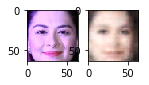

 55%|##  |ETA:   0:04:15  Epoch: 2   Iter: 1699   Class Loss: 0.00   Loss: 0.03

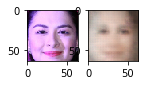

 58%|##  |ETA:   0:03:39  Epoch: 2   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


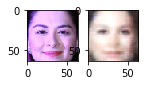

 62%|##  |ETA:   0:03:46  Epoch: 2   Iter: 1899   Class Loss: 0.00   Loss: 0.03

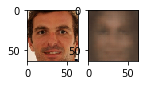

 65%|##  |ETA:   0:03:09  Epoch: 2   Iter: 1999   Class Loss: 0.00   Loss: 0.03

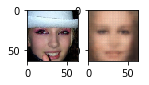

 68%|##  |ETA:   0:02:55  Epoch: 2   Iter: 2099   Class Loss: 0.00   Loss: 0.02

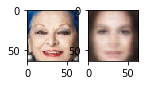

 72%|##  |ETA:   0:02:49  Epoch: 2   Iter: 2199   Class Loss: 0.00   Loss: 0.03

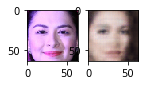

 75%|### |ETA:   0:02:12  Epoch: 2   Iter: 2299   Class Loss: 0.00   Loss: 0.03

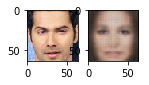

 78%|### |ETA:   0:01:51  Epoch: 2   Iter: 2399   Class Loss: 0.00   Loss: 0.03

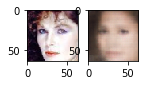

 81%|### |ETA:   0:01:37  Epoch: 2   Iter: 2499   Class Loss: 0.00   Loss: 0.03

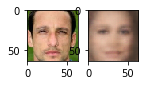

 85%|### |ETA:   0:01:25  Epoch: 2   Iter: 2599   Class Loss: 0.00   Loss: 0.02

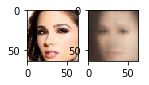

 88%|### |ETA:   0:01:02  Epoch: 2   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


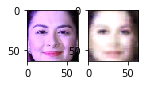

 91%|### |ETA:   0:00:42  Epoch: 2   Iter: 2799   Class Loss: 0.00   Loss: 0.03

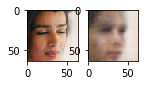

 94%|### |ETA:   0:00:28  Epoch: 2   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


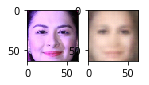

 98%|### |ETA:   0:00:08  Epoch: 2   Iter: 2999   Class Loss: 0.00   Loss: 0.02

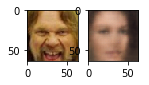

100%|####|Time:  0:09:02  Epoch: 2   Iter: 3052   Class Loss: 0.02   Loss: 0.04


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

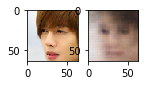

  3%|      |ETA:   0:08:13  Epoch: 3   Iter: 99   Class Loss: 0.00   Loss: 0.02

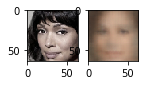

  6%|     |ETA:   0:08:12  Epoch: 3   Iter: 199   Class Loss: 0.00   Loss: 0.03

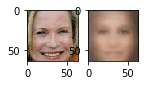

  9%|     |ETA:   0:07:59  Epoch: 3   Iter: 299   Class Loss: 0.00   Loss: 0.03

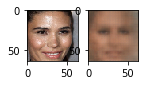

 13%|     |ETA:   0:07:25  Epoch: 3   Iter: 399   Class Loss: 0.00   Loss: 0.02

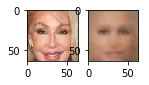

 16%|     |ETA:   0:08:16  Epoch: 3   Iter: 499   Class Loss: 0.00   Loss: 0.02

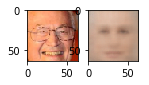

 19%|     |ETA:   0:07:28  Epoch: 3   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


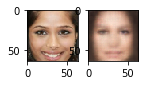

 22%|#    |ETA:   0:08:15  Epoch: 3   Iter: 699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


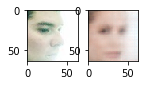

 26%|#    |ETA:   0:07:23  Epoch: 3   Iter: 799   Class Loss: 0.00   Loss: 0.03

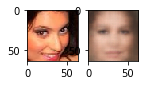

 29%|#    |ETA:   0:07:00  Epoch: 3   Iter: 899   Class Loss: 0.00   Loss: 0.02

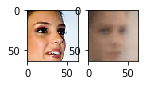

 32%|#    |ETA:   0:06:41  Epoch: 3   Iter: 999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


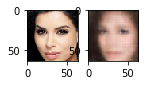

 36%|#   |ETA:   0:06:06  Epoch: 3   Iter: 1099   Class Loss: 0.00   Loss: 0.03

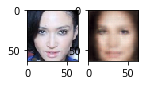

 39%|#   |ETA:   0:05:44  Epoch: 3   Iter: 1199   Class Loss: 0.00   Loss: 0.02

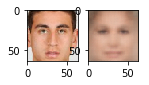

 42%|#   |ETA:   0:05:29  Epoch: 3   Iter: 1299   Class Loss: 0.00   Loss: 0.02

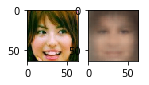

 45%|#   |ETA:   0:04:55  Epoch: 3   Iter: 1399   Class Loss: 0.00   Loss: 0.03

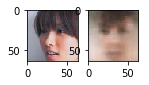

 49%|#   |ETA:   0:04:33  Epoch: 3   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


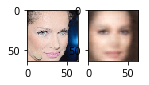

 52%|##  |ETA:   0:04:34  Epoch: 3   Iter: 1599   Class Loss: 0.01   Loss: 0.04Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


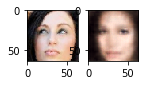

 55%|##  |ETA:   0:04:21  Epoch: 3   Iter: 1699   Class Loss: 0.00   Loss: 0.02

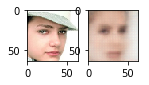

 58%|##  |ETA:   0:03:57  Epoch: 3   Iter: 1799   Class Loss: 0.00   Loss: 0.02

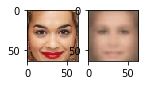

 62%|##  |ETA:   0:03:35  Epoch: 3   Iter: 1899   Class Loss: 0.21   Loss: 0.23Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


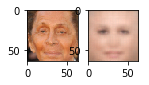

 65%|##  |ETA:   0:03:17  Epoch: 3   Iter: 1999   Class Loss: 0.02   Loss: 0.04

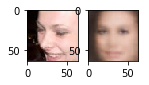

 68%|##  |ETA:   0:03:06  Epoch: 3   Iter: 2099   Class Loss: 0.00   Loss: 0.02

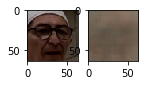

 72%|##  |ETA:   0:02:35  Epoch: 3   Iter: 2199   Class Loss: 0.00   Loss: 0.03

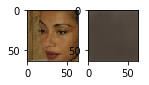

 75%|### |ETA:   0:02:11  Epoch: 3   Iter: 2299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


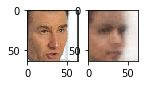

 78%|### |ETA:   0:01:54  Epoch: 3   Iter: 2399   Class Loss: 0.04   Loss: 0.06

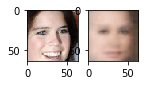

 81%|### |ETA:   0:01:38  Epoch: 3   Iter: 2499   Class Loss: 0.10   Loss: 0.12

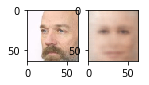

 85%|### |ETA:   0:01:21  Epoch: 3   Iter: 2599   Class Loss: 0.00   Loss: 0.02

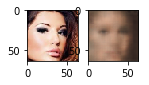

 88%|### |ETA:   0:01:04  Epoch: 3   Iter: 2699   Class Loss: 0.00   Loss: 0.03

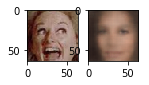

 91%|### |ETA:   0:00:45  Epoch: 3   Iter: 2799   Class Loss: 0.00   Loss: 0.02

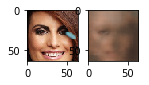

 94%|### |ETA:   0:00:27  Epoch: 3   Iter: 2899   Class Loss: 0.00   Loss: 0.03

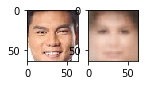

 98%|### |ETA:   0:00:09  Epoch: 3   Iter: 2999   Class Loss: 0.00   Loss: 0.02

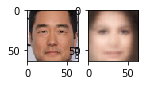

100%|####|Time:  0:09:24  Epoch: 3   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

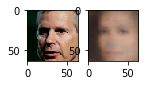

  3%|      |ETA:   0:07:48  Epoch: 4   Iter: 99   Class Loss: 0.00   Loss: 0.03

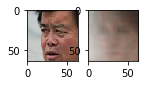

  6%|     |ETA:   0:07:39  Epoch: 4   Iter: 199   Class Loss: 0.00   Loss: 0.03

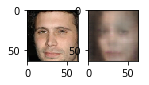

  9%|     |ETA:   0:08:44  Epoch: 4   Iter: 299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


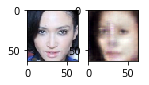

 13%|     |ETA:   0:07:50  Epoch: 4   Iter: 399   Class Loss: 0.00   Loss: 0.03

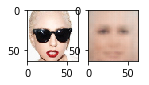

 16%|     |ETA:   0:07:47  Epoch: 4   Iter: 499   Class Loss: 0.00   Loss: 0.02

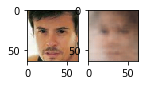

 19%|     |ETA:   0:07:09  Epoch: 4   Iter: 599   Class Loss: 0.00   Loss: 0.02

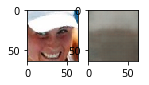

 22%|#    |ETA:   0:07:16  Epoch: 4   Iter: 699   Class Loss: 0.00   Loss: 0.03

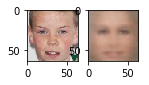

 26%|#    |ETA:   0:06:50  Epoch: 4   Iter: 799   Class Loss: 0.03   Loss: 0.05

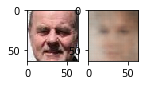

 29%|#    |ETA:   0:06:26  Epoch: 4   Iter: 899   Class Loss: 0.00   Loss: 0.02

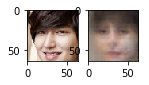

 32%|#    |ETA:   0:06:15  Epoch: 4   Iter: 999   Class Loss: 0.00   Loss: 0.03

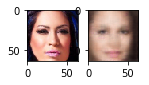

 36%|#   |ETA:   0:05:57  Epoch: 4   Iter: 1099   Class Loss: 0.10   Loss: 0.13

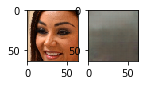

 39%|#   |ETA:   0:05:47  Epoch: 4   Iter: 1199   Class Loss: 0.00   Loss: 0.03

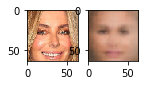

 42%|#   |ETA:   0:05:04  Epoch: 4   Iter: 1299   Class Loss: 0.01   Loss: 0.03

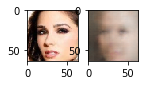

 45%|#   |ETA:   0:04:55  Epoch: 4   Iter: 1399   Class Loss: 0.00   Loss: 0.02

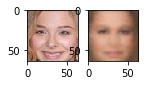

 49%|#   |ETA:   0:04:50  Epoch: 4   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


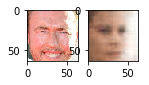

 52%|##  |ETA:   0:04:26  Epoch: 4   Iter: 1599   Class Loss: 0.00   Loss: 0.02

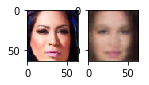

 55%|##  |ETA:   0:03:43  Epoch: 4   Iter: 1699   Class Loss: 0.02   Loss: 0.10

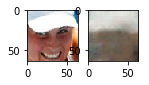

 58%|##  |ETA:   0:03:40  Epoch: 4   Iter: 1799   Class Loss: 0.00   Loss: 0.02

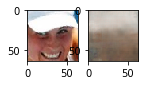

 62%|##  |ETA:   0:03:30  Epoch: 4   Iter: 1899   Class Loss: 0.00   Loss: 0.03

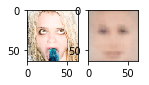

 65%|##  |ETA:   0:03:06  Epoch: 4   Iter: 1999   Class Loss: 0.00   Loss: 0.02

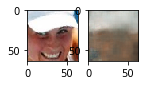

 68%|##  |ETA:   0:02:52  Epoch: 4   Iter: 2099   Class Loss: 0.00   Loss: 0.02

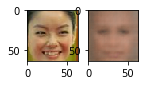

 72%|##  |ETA:   0:02:16  Epoch: 4   Iter: 2199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


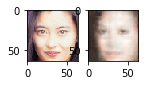

 75%|### |ETA:   0:02:14  Epoch: 4   Iter: 2299   Class Loss: 0.03   Loss: 0.05

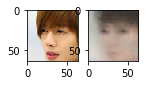

 78%|### |ETA:   0:02:32  Epoch: 4   Iter: 2399   Class Loss: 0.00   Loss: 0.03

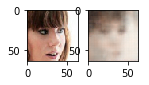

 81%|### |ETA:   0:01:35  Epoch: 4   Iter: 2499   Class Loss: 0.00   Loss: 0.02

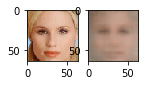

 85%|### |ETA:   0:01:12  Epoch: 4   Iter: 2599   Class Loss: 0.00   Loss: 0.03

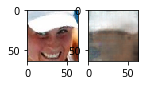

 88%|### |ETA:   0:00:55  Epoch: 4   Iter: 2699   Class Loss: 0.00   Loss: 0.02

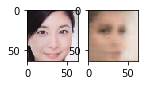

 91%|### |ETA:   0:00:38  Epoch: 4   Iter: 2799   Class Loss: 0.00   Loss: 0.02

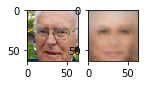

 94%|### |ETA:   0:00:23  Epoch: 4   Iter: 2899   Class Loss: 0.00   Loss: 0.03

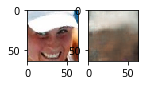

 98%|### |ETA:   0:00:07  Epoch: 4   Iter: 2999   Class Loss: 0.00   Loss: 0.02

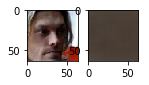

100%|####|Time:  0:08:50  Epoch: 4   Iter: 3052   Class Loss: 0.00   Loss: 0.03


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


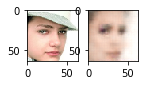

  3%|      |ETA:   0:07:17  Epoch: 5   Iter: 99   Class Loss: 0.00   Loss: 0.03

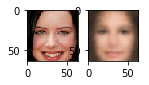

  6%|     |ETA:   0:07:18  Epoch: 5   Iter: 199   Class Loss: 0.05   Loss: 0.08Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


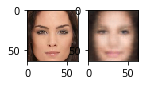

  9%|     |ETA:   0:07:15  Epoch: 5   Iter: 299   Class Loss: 0.00   Loss: 0.03

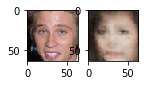

 13%|     |ETA:   0:07:01  Epoch: 5   Iter: 399   Class Loss: 0.00   Loss: 0.02

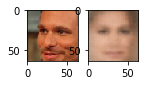

 16%|     |ETA:   0:06:48  Epoch: 5   Iter: 499   Class Loss: 0.00   Loss: 0.02

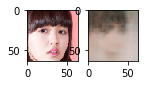

 19%|     |ETA:   0:06:47  Epoch: 5   Iter: 599   Class Loss: 0.00   Loss: 0.02

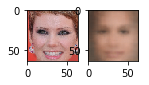

 22%|#    |ETA:   0:06:29  Epoch: 5   Iter: 699   Class Loss: 0.00   Loss: 0.03

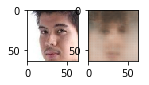

 26%|#    |ETA:   0:06:11  Epoch: 5   Iter: 799   Class Loss: 0.00   Loss: 0.02

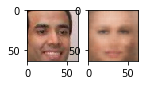

 29%|#    |ETA:   0:05:50  Epoch: 5   Iter: 899   Class Loss: 0.11   Loss: 0.13

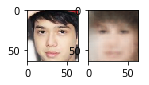

 32%|#    |ETA:   0:05:42  Epoch: 5   Iter: 999   Class Loss: 0.00   Loss: 0.03

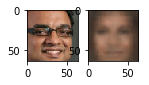

 36%|#   |ETA:   0:05:49  Epoch: 5   Iter: 1099   Class Loss: 0.00   Loss: 0.02

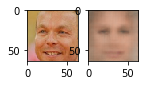

 39%|#   |ETA:   0:05:06  Epoch: 5   Iter: 1199   Class Loss: 0.00   Loss: 0.02

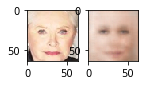

 42%|#   |ETA:   0:04:44  Epoch: 5   Iter: 1299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


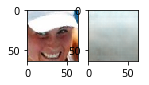

 45%|#   |ETA:   0:04:31  Epoch: 5   Iter: 1399   Class Loss: 0.00   Loss: 0.02

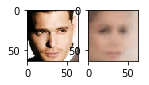

 49%|#   |ETA:   0:04:15  Epoch: 5   Iter: 1499   Class Loss: 0.00   Loss: 0.02

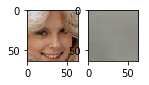

 52%|##  |ETA:   0:03:57  Epoch: 5   Iter: 1599   Class Loss: 0.00   Loss: 0.03

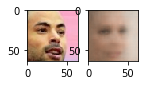

 55%|##  |ETA:   0:03:43  Epoch: 5   Iter: 1699   Class Loss: 0.00   Loss: 0.02

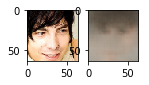

 58%|##  |ETA:   0:03:29  Epoch: 5   Iter: 1799   Class Loss: 0.03   Loss: 0.06

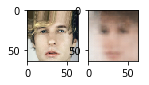

 62%|##  |ETA:   0:03:11  Epoch: 5   Iter: 1899   Class Loss: 0.00   Loss: 0.02

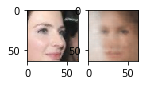

 65%|##  |ETA:   0:03:35  Epoch: 5   Iter: 1999   Class Loss: 0.00   Loss: 0.02

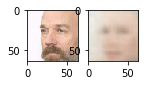

 68%|##  |ETA:   0:02:35  Epoch: 5   Iter: 2099   Class Loss: 0.00   Loss: 0.02

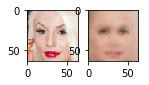

 72%|##  |ETA:   0:02:24  Epoch: 5   Iter: 2199   Class Loss: 0.00   Loss: 0.03

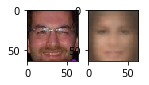

 75%|### |ETA:   0:02:08  Epoch: 5   Iter: 2299   Class Loss: 0.00   Loss: 0.02

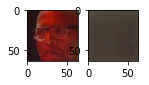

 78%|### |ETA:   0:01:48  Epoch: 5   Iter: 2399   Class Loss: 0.00   Loss: 0.02

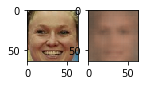

 81%|### |ETA:   0:01:32  Epoch: 5   Iter: 2499   Class Loss: 0.04   Loss: 0.06Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


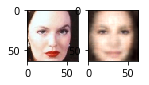

 85%|### |ETA:   0:01:14  Epoch: 5   Iter: 2599   Class Loss: 0.05   Loss: 0.07

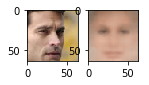

 88%|### |ETA:   0:00:58  Epoch: 5   Iter: 2699   Class Loss: 0.00   Loss: 0.03

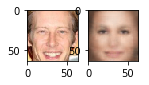

 91%|### |ETA:   0:00:42  Epoch: 5   Iter: 2799   Class Loss: 0.03   Loss: 0.05

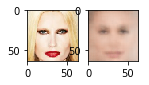

 94%|### |ETA:   0:00:27  Epoch: 5   Iter: 2899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


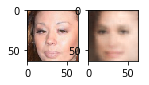

 98%|### |ETA:   0:00:09  Epoch: 5   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


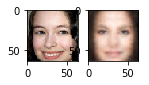

100%|####|Time:  0:08:32  Epoch: 5   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

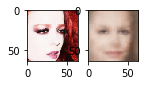

  3%|      |ETA:   0:08:17  Epoch: 6   Iter: 99   Class Loss: 0.00   Loss: 0.03

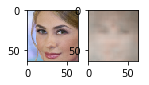

  6%|     |ETA:   0:08:06  Epoch: 6   Iter: 199   Class Loss: 0.03   Loss: 0.06

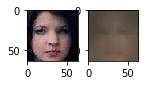

  9%|     |ETA:   0:07:50  Epoch: 6   Iter: 299   Class Loss: 0.00   Loss: 0.03

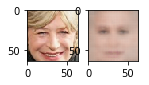

 13%|     |ETA:   0:07:23  Epoch: 6   Iter: 399   Class Loss: 0.00   Loss: 0.02

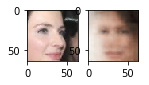

 16%|     |ETA:   0:07:30  Epoch: 6   Iter: 499   Class Loss: 0.00   Loss: 0.03

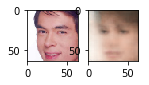

 19%|     |ETA:   0:07:11  Epoch: 6   Iter: 599   Class Loss: 0.00   Loss: 0.02

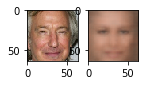

 22%|#    |ETA:   0:06:37  Epoch: 6   Iter: 699   Class Loss: 0.00   Loss: 0.02

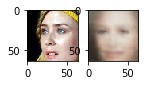

 26%|#    |ETA:   0:06:21  Epoch: 6   Iter: 799   Class Loss: 0.00   Loss: 0.02

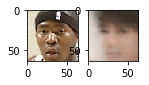

 29%|#    |ETA:   0:06:09  Epoch: 6   Iter: 899   Class Loss: 0.00   Loss: 0.02

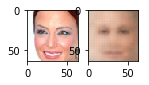

 32%|#    |ETA:   0:05:33  Epoch: 6   Iter: 999   Class Loss: 0.00   Loss: 0.03

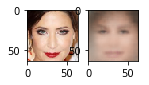

 36%|#   |ETA:   0:05:39  Epoch: 6   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


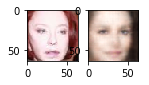

 39%|#   |ETA:   0:05:13  Epoch: 6   Iter: 1199   Class Loss: 0.01   Loss: 0.03

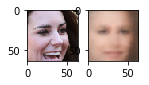

 42%|#   |ETA:   0:05:01  Epoch: 6   Iter: 1299   Class Loss: 0.00   Loss: 0.03

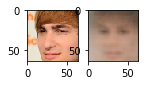

 45%|#   |ETA:   0:04:37  Epoch: 6   Iter: 1399   Class Loss: 0.00   Loss: 0.02

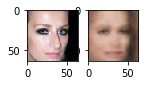

 49%|#   |ETA:   0:04:16  Epoch: 6   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


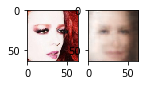

 52%|##  |ETA:   0:04:07  Epoch: 6   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


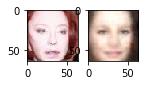

 55%|##  |ETA:   0:03:46  Epoch: 6   Iter: 1699   Class Loss: 0.00   Loss: 0.02

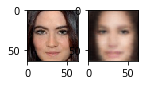

 58%|##  |ETA:   0:03:32  Epoch: 6   Iter: 1799   Class Loss: 0.00   Loss: 0.02

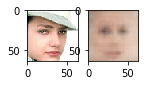

 62%|##  |ETA:   0:03:16  Epoch: 6   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


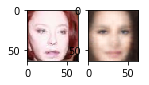

 65%|##  |ETA:   0:02:41  Epoch: 6   Iter: 1999   Class Loss: 0.00   Loss: 0.03

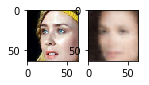

 68%|##  |ETA:   0:02:40  Epoch: 6   Iter: 2099   Class Loss: 0.00   Loss: 0.02

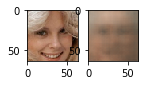

 72%|##  |ETA:   0:02:21  Epoch: 6   Iter: 2199   Class Loss: 0.00   Loss: 0.02

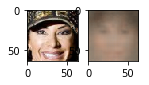

 75%|### |ETA:   0:02:10  Epoch: 6   Iter: 2299   Class Loss: 0.02   Loss: 0.05

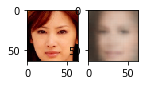

 78%|### |ETA:   0:01:48  Epoch: 6   Iter: 2399   Class Loss: 0.00   Loss: 0.03

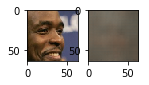

 81%|### |ETA:   0:01:32  Epoch: 6   Iter: 2499   Class Loss: 0.00   Loss: 0.02

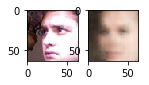

 85%|### |ETA:   0:01:14  Epoch: 6   Iter: 2599   Class Loss: 0.00   Loss: 0.02

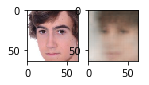

 88%|### |ETA:   0:01:01  Epoch: 6   Iter: 2699   Class Loss: 0.00   Loss: 0.02

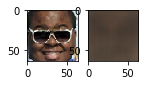

 91%|### |ETA:   0:00:48  Epoch: 6   Iter: 2799   Class Loss: 0.00   Loss: 0.02

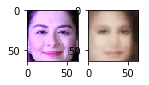

 94%|### |ETA:   0:00:26  Epoch: 6   Iter: 2899   Class Loss: 0.00   Loss: 0.02

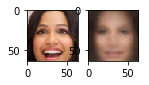

 98%|### |ETA:   0:00:09  Epoch: 6   Iter: 2999   Class Loss: 0.01   Loss: 0.04

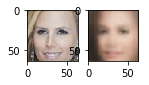

100%|####|Time:  0:08:42  Epoch: 6   Iter: 3052   Class Loss: 0.08   Loss: 0.10


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

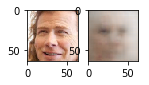

  3%|      |ETA:   0:07:42  Epoch: 7   Iter: 99   Class Loss: 0.00   Loss: 0.02

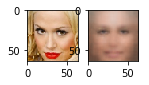

  6%|     |ETA:   0:07:15  Epoch: 7   Iter: 199   Class Loss: 0.00   Loss: 0.02

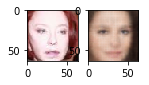

  9%|     |ETA:   0:07:05  Epoch: 7   Iter: 299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


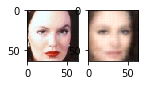

 13%|     |ETA:   0:06:43  Epoch: 7   Iter: 399   Class Loss: 0.00   Loss: 0.02

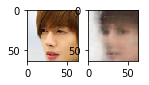

 16%|     |ETA:   0:06:52  Epoch: 7   Iter: 499   Class Loss: 0.00   Loss: 0.02

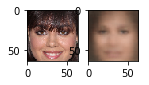

 19%|     |ETA:   0:06:15  Epoch: 7   Iter: 599   Class Loss: 0.00   Loss: 0.02

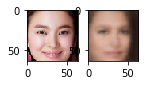

 22%|#    |ETA:   0:05:48  Epoch: 7   Iter: 699   Class Loss: 0.00   Loss: 0.02

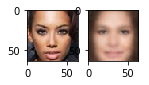

 26%|#    |ETA:   0:05:59  Epoch: 7   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


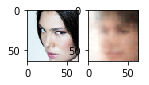

 29%|#    |ETA:   0:05:20  Epoch: 7   Iter: 899   Class Loss: 0.00   Loss: 0.03

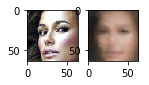

 32%|#    |ETA:   0:05:00  Epoch: 7   Iter: 999   Class Loss: 0.00   Loss: 0.02

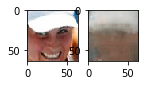

 36%|#   |ETA:   0:04:57  Epoch: 7   Iter: 1099   Class Loss: 0.00   Loss: 0.02

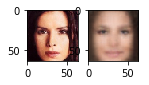

 39%|#   |ETA:   0:04:42  Epoch: 7   Iter: 1199   Class Loss: 0.00   Loss: 0.03

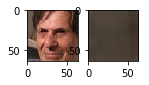

 42%|#   |ETA:   0:04:27  Epoch: 7   Iter: 1299   Class Loss: 0.00   Loss: 0.02

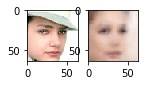

 45%|#   |ETA:   0:04:13  Epoch: 7   Iter: 1399   Class Loss: 0.00   Loss: 0.03

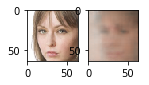

 49%|#   |ETA:   0:04:16  Epoch: 7   Iter: 1499   Class Loss: 0.00   Loss: 0.02

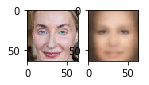

 52%|##  |ETA:   0:03:44  Epoch: 7   Iter: 1599   Class Loss: 0.00   Loss: 0.03

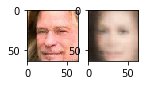

 55%|##  |ETA:   0:03:28  Epoch: 7   Iter: 1699   Class Loss: 0.00   Loss: 0.02

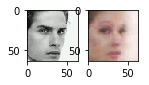

 58%|##  |ETA:   0:03:21  Epoch: 7   Iter: 1799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


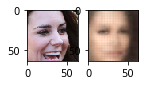

 62%|##  |ETA:   0:03:04  Epoch: 7   Iter: 1899   Class Loss: 0.00   Loss: 0.02

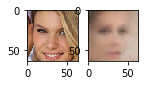

 65%|##  |ETA:   0:03:05  Epoch: 7   Iter: 1999   Class Loss: 0.00   Loss: 0.02

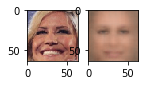

 68%|##  |ETA:   0:02:37  Epoch: 7   Iter: 2099   Class Loss: 0.00   Loss: 0.02

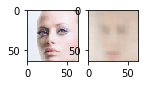

 72%|##  |ETA:   0:02:22  Epoch: 7   Iter: 2199   Class Loss: 0.00   Loss: 0.02

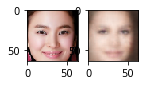

 75%|### |ETA:   0:02:06  Epoch: 7   Iter: 2299   Class Loss: 0.02   Loss: 0.04

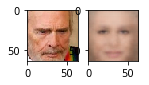

 78%|### |ETA:   0:01:48  Epoch: 7   Iter: 2399   Class Loss: 0.00   Loss: 0.03

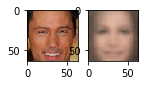

 81%|### |ETA:   0:01:32  Epoch: 7   Iter: 2499   Class Loss: 0.00   Loss: 0.02

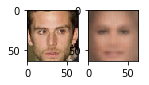

 85%|### |ETA:   0:01:15  Epoch: 7   Iter: 2599   Class Loss: 0.00   Loss: 0.02

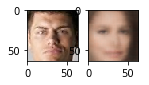

 88%|### |ETA:   0:00:59  Epoch: 7   Iter: 2699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


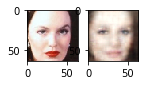

 91%|### |ETA:   0:00:42  Epoch: 7   Iter: 2799   Class Loss: 0.00   Loss: 0.02

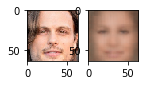

 94%|### |ETA:   0:00:26  Epoch: 7   Iter: 2899   Class Loss: 0.00   Loss: 0.02

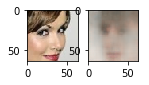

 98%|### |ETA:   0:00:09  Epoch: 7   Iter: 2999   Class Loss: 0.00   Loss: 0.02

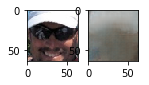

100%|####|Time:  0:08:08  Epoch: 7   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


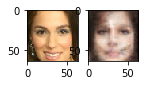

  3%|      |ETA:   0:08:18  Epoch: 8   Iter: 99   Class Loss: 0.00   Loss: 0.03

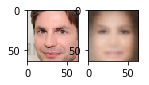

  6%|     |ETA:   0:07:54  Epoch: 8   Iter: 199   Class Loss: 0.00   Loss: 0.02

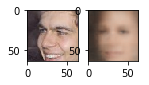

  9%|     |ETA:   0:07:35  Epoch: 8   Iter: 299   Class Loss: 0.00   Loss: 0.02

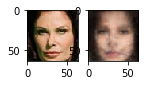

 13%|     |ETA:   0:07:28  Epoch: 8   Iter: 399   Class Loss: 0.00   Loss: 0.02

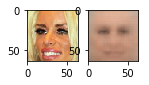

 16%|     |ETA:   0:07:19  Epoch: 8   Iter: 499   Class Loss: 0.00   Loss: 0.02

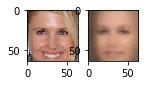

 19%|     |ETA:   0:06:49  Epoch: 8   Iter: 599   Class Loss: 0.00   Loss: 0.02

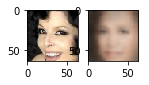

 22%|#    |ETA:   0:06:30  Epoch: 8   Iter: 699   Class Loss: 0.00   Loss: 0.02

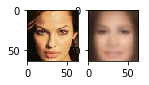

 26%|#    |ETA:   0:06:12  Epoch: 8   Iter: 799   Class Loss: 0.00   Loss: 0.02

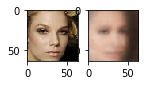

 29%|#    |ETA:   0:06:06  Epoch: 8   Iter: 899   Class Loss: 0.00   Loss: 0.02

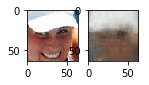

 32%|#    |ETA:   0:05:37  Epoch: 8   Iter: 999   Class Loss: 0.00   Loss: 0.02

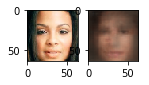

 36%|#   |ETA:   0:05:43  Epoch: 8   Iter: 1099   Class Loss: 0.00   Loss: 0.02

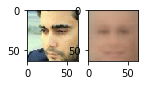

 39%|#   |ETA:   0:05:29  Epoch: 8   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


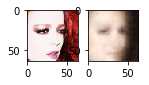

 42%|#   |ETA:   0:05:12  Epoch: 8   Iter: 1299   Class Loss: 0.00   Loss: 0.03

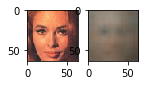

 45%|#   |ETA:   0:04:34  Epoch: 8   Iter: 1399   Class Loss: 0.00   Loss: 0.03

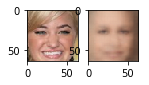

 49%|#   |ETA:   0:04:19  Epoch: 8   Iter: 1499   Class Loss: 0.00   Loss: 0.02

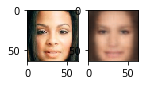

 52%|##  |ETA:   0:04:00  Epoch: 8   Iter: 1599   Class Loss: 0.00   Loss: 0.02

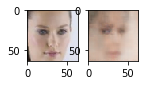

 55%|##  |ETA:   0:04:01  Epoch: 8   Iter: 1699   Class Loss: 0.00   Loss: 0.02

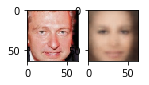

 58%|##  |ETA:   0:03:33  Epoch: 8   Iter: 1799   Class Loss: 0.00   Loss: 0.02

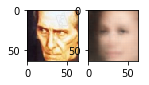

 62%|##  |ETA:   0:03:12  Epoch: 8   Iter: 1899   Class Loss: 0.00   Loss: 0.02

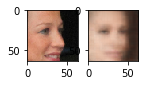

 65%|##  |ETA:   0:03:02  Epoch: 8   Iter: 1999   Class Loss: 0.00   Loss: 0.03

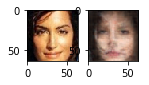

 68%|##  |ETA:   0:02:46  Epoch: 8   Iter: 2099   Class Loss: 0.00   Loss: 0.03

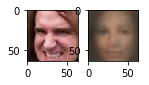

 72%|##  |ETA:   0:02:25  Epoch: 8   Iter: 2199   Class Loss: 0.00   Loss: 0.03

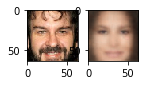

 75%|### |ETA:   0:02:06  Epoch: 8   Iter: 2299   Class Loss: 0.03   Loss: 0.06

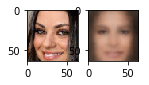

 78%|### |ETA:   0:01:53  Epoch: 8   Iter: 2399   Class Loss: 0.00   Loss: 0.02

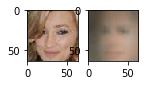

 81%|### |ETA:   0:01:32  Epoch: 8   Iter: 2499   Class Loss: 0.00   Loss: 0.02

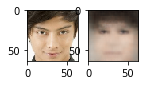

 85%|### |ETA:   0:01:17  Epoch: 8   Iter: 2599   Class Loss: 0.00   Loss: 0.02

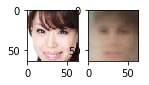

 88%|### |ETA:   0:01:00  Epoch: 8   Iter: 2699   Class Loss: 0.00   Loss: 0.02

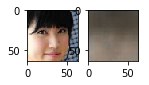

 91%|### |ETA:   0:00:41  Epoch: 8   Iter: 2799   Class Loss: 0.01   Loss: 0.04Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


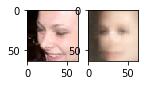

 94%|### |ETA:   0:00:26  Epoch: 8   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


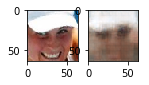

 98%|### |ETA:   0:00:08  Epoch: 8   Iter: 2999   Class Loss: 0.00   Loss: 0.02

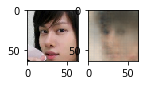

100%|####|Time:  0:08:39  Epoch: 8   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


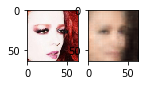

  3%|      |ETA:   0:08:19  Epoch: 9   Iter: 99   Class Loss: 0.00   Loss: 0.02

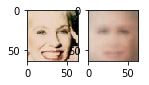

  6%|     |ETA:   0:07:55  Epoch: 9   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


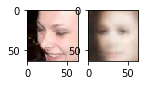

  9%|     |ETA:   0:08:26  Epoch: 9   Iter: 299   Class Loss: 0.00   Loss: 0.02

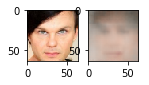

 13%|     |ETA:   0:07:33  Epoch: 9   Iter: 399   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


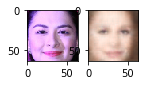

 16%|     |ETA:   0:07:05  Epoch: 9   Iter: 499   Class Loss: 0.00   Loss: 0.02

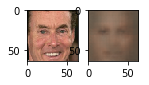

 19%|     |ETA:   0:06:28  Epoch: 9   Iter: 599   Class Loss: 0.00   Loss: 0.02

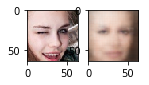

 22%|#    |ETA:   0:06:59  Epoch: 9   Iter: 699   Class Loss: 0.00   Loss: 0.02

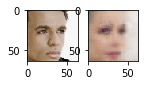

 26%|#    |ETA:   0:06:21  Epoch: 9   Iter: 799   Class Loss: 0.07   Loss: 0.09

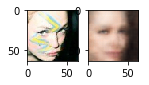

 29%|#    |ETA:   0:06:01  Epoch: 9   Iter: 899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


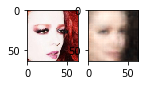

 32%|#    |ETA:   0:05:42  Epoch: 9   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


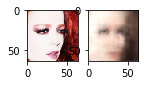

 36%|#   |ETA:   0:05:44  Epoch: 9   Iter: 1099   Class Loss: 0.00   Loss: 0.02

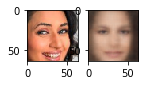

 39%|#   |ETA:   0:04:37  Epoch: 9   Iter: 1199   Class Loss: 0.00   Loss: 0.02

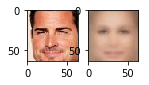

 42%|#   |ETA:   0:05:01  Epoch: 9   Iter: 1299   Class Loss: 0.00   Loss: 0.03

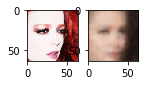

 45%|#   |ETA:   0:04:35  Epoch: 9   Iter: 1399   Class Loss: 0.00   Loss: 0.02

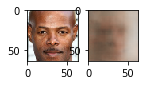

 49%|#   |ETA:   0:04:33  Epoch: 9   Iter: 1499   Class Loss: 0.00   Loss: 0.02

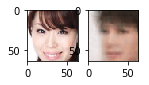

 52%|##  |ETA:   0:04:06  Epoch: 9   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


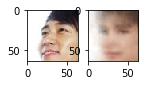

 55%|##  |ETA:   0:03:59  Epoch: 9   Iter: 1699   Class Loss: 0.00   Loss: 0.02

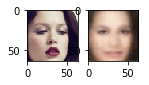

 58%|##  |ETA:   0:03:31  Epoch: 9   Iter: 1799   Class Loss: 0.00   Loss: 0.02

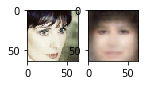

 62%|##  |ETA:   0:03:21  Epoch: 9   Iter: 1899   Class Loss: 0.02   Loss: 0.05Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


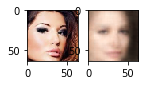

 65%|##  |ETA:   0:03:06  Epoch: 9   Iter: 1999   Class Loss: 0.00   Loss: 0.02

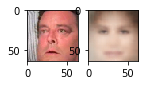

 68%|##  |ETA:   0:02:43  Epoch: 9   Iter: 2099   Class Loss: 0.00   Loss: 0.02

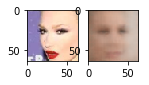

 72%|##  |ETA:   0:02:23  Epoch: 9   Iter: 2199   Class Loss: 0.00   Loss: 0.02

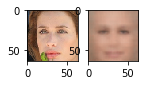

 75%|### |ETA:   0:02:06  Epoch: 9   Iter: 2299   Class Loss: 0.00   Loss: 0.02

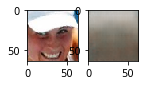

 78%|### |ETA:   0:01:51  Epoch: 9   Iter: 2399   Class Loss: 0.00   Loss: 0.02

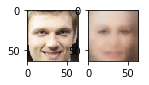

 81%|### |ETA:   0:01:30  Epoch: 9   Iter: 2499   Class Loss: 0.00   Loss: 0.02

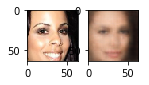

 85%|### |ETA:   0:01:16  Epoch: 9   Iter: 2599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


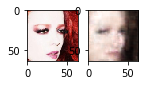

 88%|### |ETA:   0:00:58  Epoch: 9   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


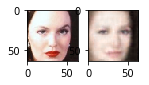

 91%|### |ETA:   0:00:42  Epoch: 9   Iter: 2799   Class Loss: 0.00   Loss: 0.02

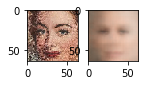

 94%|### |ETA:   0:00:26  Epoch: 9   Iter: 2899   Class Loss: 0.00   Loss: 0.02

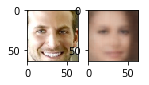

 98%|### |ETA:   0:00:09  Epoch: 9   Iter: 2999   Class Loss: 0.03   Loss: 0.05Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


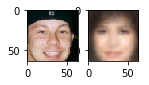

100%|####|Time:  0:08:39  Epoch: 9   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

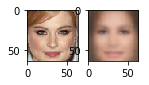

  3%|     |ETA:   0:08:51  Epoch: 10   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


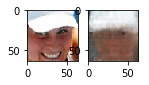

  6%|    |ETA:   0:08:17  Epoch: 10   Iter: 199   Class Loss: 0.00   Loss: 0.02

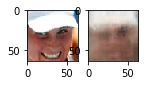

  9%|    |ETA:   0:07:54  Epoch: 10   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


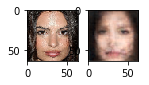

 13%|    |ETA:   0:07:29  Epoch: 10   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


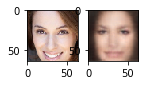

 16%|    |ETA:   0:07:25  Epoch: 10   Iter: 499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


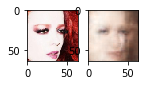

 19%|    |ETA:   0:06:49  Epoch: 10   Iter: 599   Class Loss: 0.00   Loss: 0.02

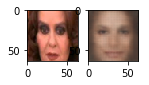

 22%|    |ETA:   0:06:42  Epoch: 10   Iter: 699   Class Loss: 0.00   Loss: 0.02

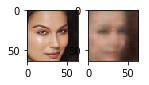

 26%|#   |ETA:   0:06:20  Epoch: 10   Iter: 799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


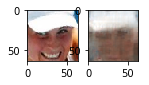

 29%|#   |ETA:   0:06:04  Epoch: 10   Iter: 899   Class Loss: 0.00   Loss: 0.03

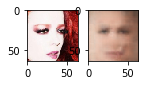

 32%|#   |ETA:   0:05:40  Epoch: 10   Iter: 999   Class Loss: 0.00   Loss: 0.02

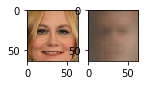

 36%|#  |ETA:   0:05:29  Epoch: 10   Iter: 1099   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


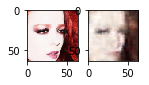

 39%|#  |ETA:   0:05:19  Epoch: 10   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


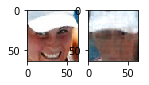

 42%|#  |ETA:   0:05:20  Epoch: 10   Iter: 1299   Class Loss: 0.00   Loss: 0.02

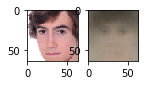

 45%|#  |ETA:   0:04:58  Epoch: 10   Iter: 1399   Class Loss: 0.00   Loss: 0.02

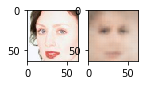

 49%|#  |ETA:   0:04:31  Epoch: 10   Iter: 1499   Class Loss: 0.00   Loss: 0.02

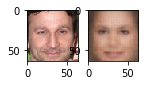

 52%|#  |ETA:   0:04:02  Epoch: 10   Iter: 1599   Class Loss: 0.00   Loss: 0.03

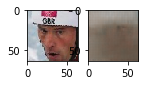

 55%|#  |ETA:   0:03:50  Epoch: 10   Iter: 1699   Class Loss: 0.00   Loss: 0.03

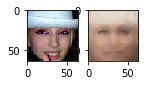

 58%|#  |ETA:   0:03:34  Epoch: 10   Iter: 1799   Class Loss: 0.00   Loss: 0.02

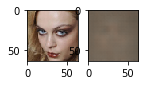

 62%|#  |ETA:   0:03:25  Epoch: 10   Iter: 1899   Class Loss: 0.00   Loss: 0.02

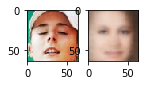

 65%|#  |ETA:   0:03:03  Epoch: 10   Iter: 1999   Class Loss: 0.00   Loss: 0.02

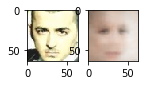

 68%|## |ETA:   0:02:43  Epoch: 10   Iter: 2099   Class Loss: 0.00   Loss: 0.03

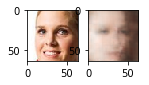

 72%|## |ETA:   0:02:23  Epoch: 10   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


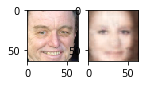

 75%|## |ETA:   0:02:09  Epoch: 10   Iter: 2299   Class Loss: 0.00   Loss: 0.02

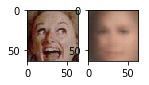

 78%|## |ETA:   0:01:47  Epoch: 10   Iter: 2399   Class Loss: 0.00   Loss: 0.02

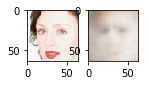

 81%|## |ETA:   0:01:26  Epoch: 10   Iter: 2499   Class Loss: 0.00   Loss: 0.02

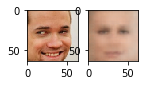

 85%|## |ETA:   0:01:20  Epoch: 10   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


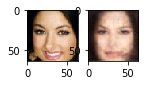

 88%|## |ETA:   0:00:58  Epoch: 10   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


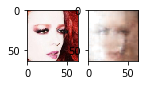

 91%|## |ETA:   0:00:42  Epoch: 10   Iter: 2799   Class Loss: 0.00   Loss: 0.02

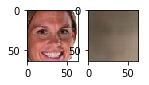

 94%|## |ETA:   0:00:26  Epoch: 10   Iter: 2899   Class Loss: 0.00   Loss: 0.02

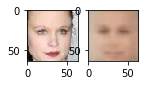

 98%|## |ETA:   0:00:09  Epoch: 10   Iter: 2999   Class Loss: 0.00   Loss: 0.02

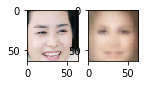

100%|###|Time:  0:08:42  Epoch: 10   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


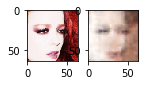

  3%|     |ETA:   0:07:56  Epoch: 11   Iter: 99   Class Loss: 0.00   Loss: 0.02

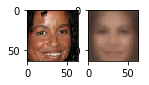

  6%|    |ETA:   0:06:53  Epoch: 11   Iter: 199   Class Loss: 0.00   Loss: 0.02

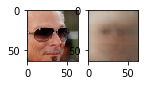

  9%|    |ETA:   0:07:19  Epoch: 11   Iter: 299   Class Loss: 0.00   Loss: 0.03

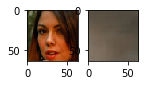

 13%|    |ETA:   0:06:54  Epoch: 11   Iter: 399   Class Loss: 0.00   Loss: 0.02

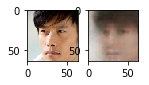

 16%|    |ETA:   0:07:21  Epoch: 11   Iter: 499   Class Loss: 0.00   Loss: 0.02

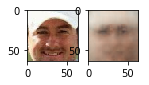

 19%|    |ETA:   0:06:33  Epoch: 11   Iter: 599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


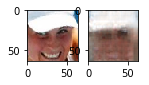

 22%|    |ETA:   0:06:25  Epoch: 11   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


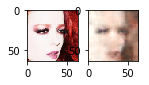

 26%|#   |ETA:   0:06:15  Epoch: 11   Iter: 799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


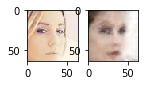

 29%|#   |ETA:   0:05:54  Epoch: 11   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


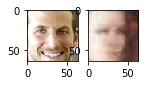

 32%|#   |ETA:   0:05:56  Epoch: 11   Iter: 999   Class Loss: 0.00   Loss: 0.02

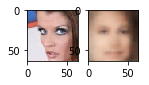

 36%|#  |ETA:   0:05:22  Epoch: 11   Iter: 1099   Class Loss: 0.00   Loss: 0.03

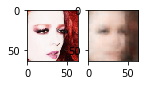

 39%|#  |ETA:   0:05:13  Epoch: 11   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


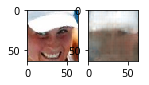

 42%|#  |ETA:   0:04:54  Epoch: 11   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


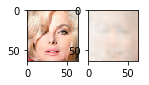

 45%|#  |ETA:   0:04:41  Epoch: 11   Iter: 1399   Class Loss: 0.00   Loss: 0.02

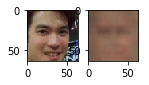

 49%|#  |ETA:   0:04:22  Epoch: 11   Iter: 1499   Class Loss: 0.00   Loss: 0.03

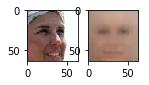

 52%|#  |ETA:   0:04:25  Epoch: 11   Iter: 1599   Class Loss: 0.09   Loss: 0.12Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


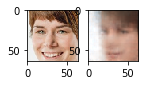

 55%|#  |ETA:   0:04:02  Epoch: 11   Iter: 1699   Class Loss: 0.00   Loss: 0.02

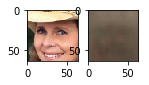

 58%|#  |ETA:   0:03:36  Epoch: 11   Iter: 1799   Class Loss: 0.00   Loss: 0.03

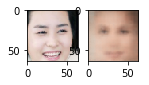

 62%|#  |ETA:   0:03:18  Epoch: 11   Iter: 1899   Class Loss: 0.00   Loss: 0.02

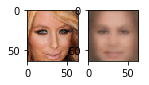

 65%|#  |ETA:   0:03:04  Epoch: 11   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


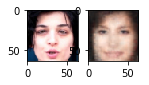

 68%|## |ETA:   0:02:26  Epoch: 11   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


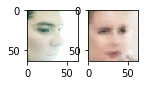

 72%|## |ETA:   0:02:24  Epoch: 11   Iter: 2199   Class Loss: 0.00   Loss: 0.03

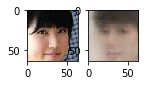

 75%|## |ETA:   0:02:11  Epoch: 11   Iter: 2299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


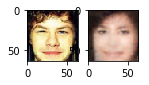

 78%|## |ETA:   0:01:55  Epoch: 11   Iter: 2399   Class Loss: 0.00   Loss: 0.03

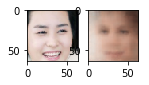

 81%|## |ETA:   0:01:35  Epoch: 11   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


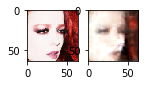

 85%|## |ETA:   0:01:17  Epoch: 11   Iter: 2599   Class Loss: 0.00   Loss: 0.02

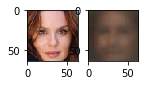

 88%|## |ETA:   0:01:04  Epoch: 11   Iter: 2699   Class Loss: 0.00   Loss: 0.02

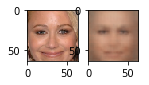

 91%|## |ETA:   0:00:44  Epoch: 11   Iter: 2799   Class Loss: 0.00   Loss: 0.02

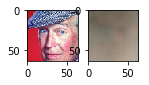

 94%|## |ETA:   0:00:27  Epoch: 11   Iter: 2899   Class Loss: 0.00   Loss: 0.02

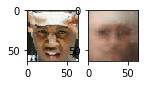

 98%|## |ETA:   0:00:09  Epoch: 11   Iter: 2999   Class Loss: 0.00   Loss: 0.02

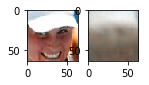

100%|###|Time:  0:08:38  Epoch: 11   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


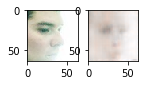

  3%|     |ETA:   0:07:45  Epoch: 12   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


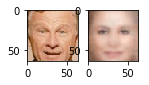

  6%|    |ETA:   0:07:17  Epoch: 12   Iter: 199   Class Loss: 0.00   Loss: 0.02

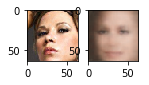

  9%|    |ETA:   0:07:01  Epoch: 12   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


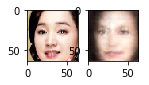

 13%|    |ETA:   0:06:45  Epoch: 12   Iter: 399   Class Loss: 0.00   Loss: 0.03

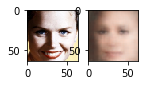

 16%|    |ETA:   0:06:25  Epoch: 12   Iter: 499   Class Loss: 0.00   Loss: 0.03

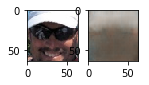

 19%|    |ETA:   0:06:35  Epoch: 12   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


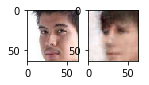

 22%|    |ETA:   0:05:59  Epoch: 12   Iter: 699   Class Loss: 0.00   Loss: 0.03

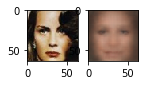

 26%|#   |ETA:   0:05:58  Epoch: 12   Iter: 799   Class Loss: 0.00   Loss: 0.03

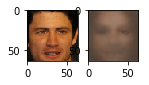

 29%|#   |ETA:   0:05:56  Epoch: 12   Iter: 899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


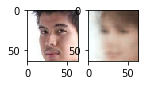

 32%|#   |ETA:   0:05:16  Epoch: 12   Iter: 999   Class Loss: 0.00   Loss: 0.02

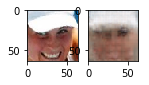

 36%|#  |ETA:   0:05:04  Epoch: 12   Iter: 1099   Class Loss: 0.00   Loss: 0.02

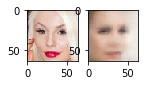

 39%|#  |ETA:   0:04:47  Epoch: 12   Iter: 1199   Class Loss: 0.00   Loss: 0.02

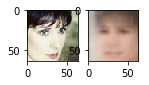

 42%|#  |ETA:   0:04:45  Epoch: 12   Iter: 1299   Class Loss: 0.00   Loss: 0.03

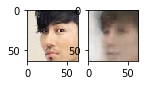

 45%|#  |ETA:   0:04:29  Epoch: 12   Iter: 1399   Class Loss: 0.00   Loss: 0.03

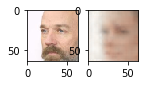

 49%|#  |ETA:   0:04:34  Epoch: 12   Iter: 1499   Class Loss: 0.00   Loss: 0.02

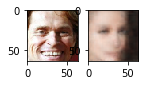

 52%|#  |ETA:   0:04:02  Epoch: 12   Iter: 1599   Class Loss: 0.00   Loss: 0.02

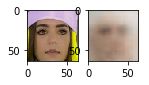

 55%|#  |ETA:   0:03:47  Epoch: 12   Iter: 1699   Class Loss: 0.00   Loss: 0.02

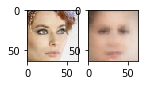

 58%|#  |ETA:   0:03:46  Epoch: 12   Iter: 1799   Class Loss: 0.00   Loss: 0.03

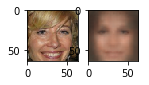

 62%|#  |ETA:   0:03:17  Epoch: 12   Iter: 1899   Class Loss: 0.00   Loss: 0.02

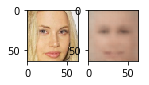

 65%|#  |ETA:   0:02:53  Epoch: 12   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


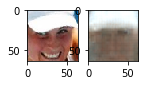

 68%|## |ETA:   0:02:51  Epoch: 12   Iter: 2099   Class Loss: 0.00   Loss: 0.02

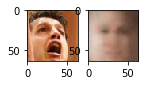

 72%|## |ETA:   0:02:28  Epoch: 12   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


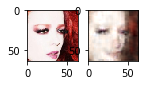

 75%|## |ETA:   0:02:14  Epoch: 12   Iter: 2299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


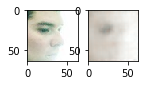

 78%|## |ETA:   0:01:52  Epoch: 12   Iter: 2399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


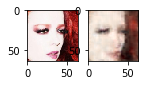

 81%|## |ETA:   0:01:38  Epoch: 12   Iter: 2499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


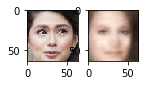

 85%|## |ETA:   0:01:19  Epoch: 12   Iter: 2599   Class Loss: 0.00   Loss: 0.02

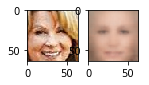

 88%|## |ETA:   0:01:01  Epoch: 12   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


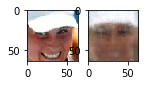

 91%|## |ETA:   0:00:39  Epoch: 12   Iter: 2799   Class Loss: 0.00   Loss: 0.03

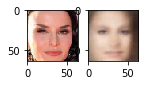

 94%|## |ETA:   0:00:28  Epoch: 12   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


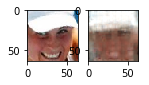

 98%|## |ETA:   0:00:09  Epoch: 12   Iter: 2999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


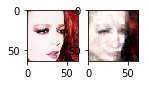

100%|###|Time:  0:08:27  Epoch: 12   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

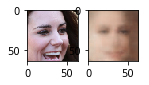

  3%|     |ETA:   0:07:42  Epoch: 13   Iter: 99   Class Loss: 0.00   Loss: 0.02

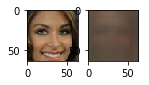

  6%|    |ETA:   0:07:12  Epoch: 13   Iter: 199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


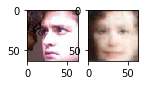

  9%|    |ETA:   0:07:10  Epoch: 13   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


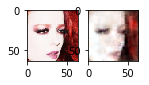

 13%|    |ETA:   0:06:53  Epoch: 13   Iter: 399   Class Loss: 0.00   Loss: 0.03

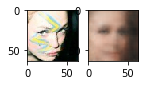

 16%|    |ETA:   0:07:21  Epoch: 13   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


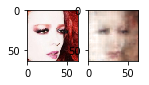

 19%|    |ETA:   0:06:45  Epoch: 13   Iter: 599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


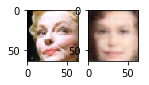

 22%|    |ETA:   0:06:56  Epoch: 13   Iter: 699   Class Loss: 0.00   Loss: 0.02

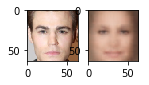

 26%|#   |ETA:   0:06:23  Epoch: 13   Iter: 799   Class Loss: 0.08   Loss: 0.10

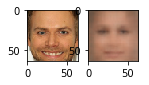

 29%|#   |ETA:   0:05:49  Epoch: 13   Iter: 899   Class Loss: 0.00   Loss: 0.02

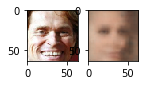

 32%|#   |ETA:   0:05:54  Epoch: 13   Iter: 999   Class Loss: 0.00   Loss: 0.02

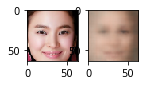

 36%|#  |ETA:   0:05:27  Epoch: 13   Iter: 1099   Class Loss: 0.00   Loss: 0.02

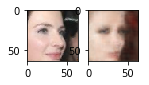

 39%|#  |ETA:   0:05:12  Epoch: 13   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


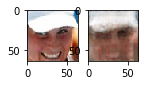

 42%|#  |ETA:   0:04:56  Epoch: 13   Iter: 1299   Class Loss: 0.00   Loss: 0.03

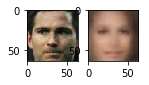

 45%|#  |ETA:   0:04:42  Epoch: 13   Iter: 1399   Class Loss: 0.00   Loss: 0.02

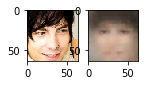

 49%|#  |ETA:   0:04:21  Epoch: 13   Iter: 1499   Class Loss: 0.00   Loss: 0.02

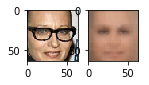

 52%|#  |ETA:   0:04:07  Epoch: 13   Iter: 1599   Class Loss: 0.00   Loss: 0.03

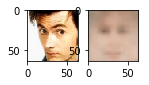

 55%|#  |ETA:   0:03:46  Epoch: 13   Iter: 1699   Class Loss: 0.00   Loss: 0.03

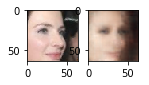

 58%|#  |ETA:   0:03:33  Epoch: 13   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


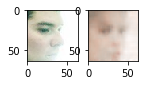

 62%|#  |ETA:   0:03:12  Epoch: 13   Iter: 1899   Class Loss: 0.00   Loss: 0.02

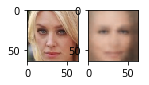

 65%|#  |ETA:   0:03:07  Epoch: 13   Iter: 1999   Class Loss: 0.00   Loss: 0.02

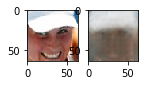

 68%|## |ETA:   0:02:27  Epoch: 13   Iter: 2099   Class Loss: 0.00   Loss: 0.02

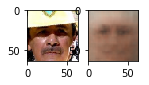

 72%|## |ETA:   0:02:27  Epoch: 13   Iter: 2199   Class Loss: 0.00   Loss: 0.02

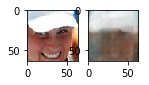

 75%|## |ETA:   0:02:07  Epoch: 13   Iter: 2299   Class Loss: 0.00   Loss: 0.02

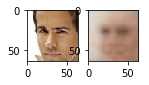

 78%|## |ETA:   0:01:50  Epoch: 13   Iter: 2399   Class Loss: 0.00   Loss: 0.02

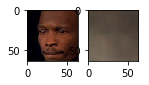

 81%|## |ETA:   0:01:36  Epoch: 13   Iter: 2499   Class Loss: 0.00   Loss: 0.02

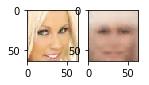

 85%|## |ETA:   0:01:21  Epoch: 13   Iter: 2599   Class Loss: 0.00   Loss: 0.02

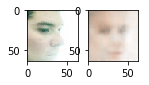

 88%|## |ETA:   0:00:59  Epoch: 13   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


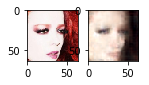

 91%|## |ETA:   0:00:43  Epoch: 13   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


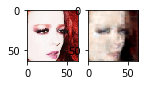

 94%|## |ETA:   0:00:25  Epoch: 13   Iter: 2899   Class Loss: 0.00   Loss: 0.02

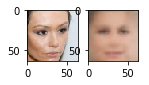

 98%|## |ETA:   0:00:09  Epoch: 13   Iter: 2999   Class Loss: 0.00   Loss: 0.02

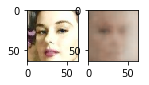

100%|###|Time:  0:08:33  Epoch: 13   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

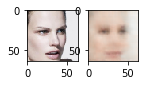

  3%|     |ETA:   0:08:24  Epoch: 14   Iter: 99   Class Loss: 0.00   Loss: 0.02

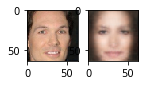

  6%|    |ETA:   0:07:56  Epoch: 14   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


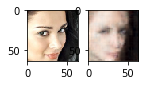

  9%|    |ETA:   0:07:51  Epoch: 14   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


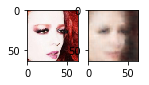

 13%|    |ETA:   0:07:55  Epoch: 14   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


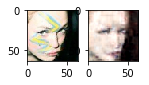

 16%|    |ETA:   0:07:05  Epoch: 14   Iter: 499   Class Loss: 0.00   Loss: 0.03

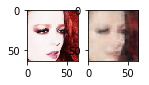

 19%|    |ETA:   0:06:53  Epoch: 14   Iter: 599   Class Loss: 0.00   Loss: 0.03

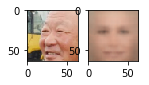

 22%|    |ETA:   0:06:44  Epoch: 14   Iter: 699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


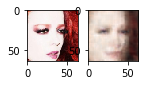

 26%|#   |ETA:   0:06:19  Epoch: 14   Iter: 799   Class Loss: 0.00   Loss: 0.02

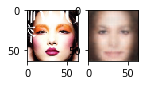

 29%|#   |ETA:   0:06:02  Epoch: 14   Iter: 899   Class Loss: 0.00   Loss: 0.02

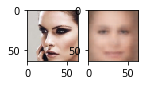

 32%|#   |ETA:   0:05:51  Epoch: 14   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


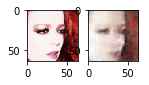

 36%|#  |ETA:   0:05:35  Epoch: 14   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


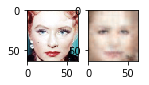

 39%|#  |ETA:   0:05:33  Epoch: 14   Iter: 1199   Class Loss: 0.00   Loss: 0.02

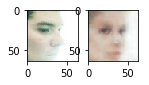

 42%|#  |ETA:   0:05:08  Epoch: 14   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


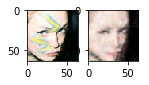

 45%|#  |ETA:   0:04:43  Epoch: 14   Iter: 1399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


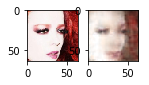

 49%|#  |ETA:   0:04:19  Epoch: 14   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


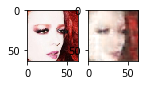

 52%|#  |ETA:   0:04:07  Epoch: 14   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


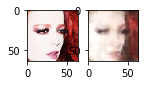

 55%|#  |ETA:   0:03:50  Epoch: 14   Iter: 1699   Class Loss: 0.00   Loss: 0.03

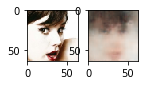

 58%|#  |ETA:   0:03:33  Epoch: 14   Iter: 1799   Class Loss: 0.00   Loss: 0.02

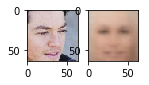

 62%|#  |ETA:   0:03:19  Epoch: 14   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


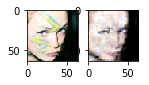

 65%|#  |ETA:   0:03:02  Epoch: 14   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


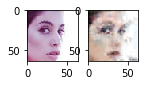

 68%|## |ETA:   0:02:40  Epoch: 14   Iter: 2099   Class Loss: 0.00   Loss: 0.02

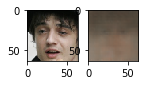

 72%|## |ETA:   0:02:29  Epoch: 14   Iter: 2199   Class Loss: 0.00   Loss: 0.02

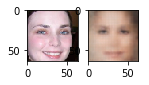

 75%|## |ETA:   0:02:15  Epoch: 14   Iter: 2299   Class Loss: 0.00   Loss: 0.02

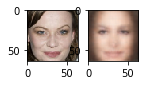

 78%|## |ETA:   0:01:51  Epoch: 14   Iter: 2399   Class Loss: 0.00   Loss: 0.02

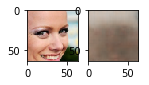

 81%|## |ETA:   0:01:37  Epoch: 14   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


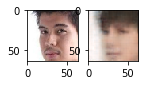

 85%|## |ETA:   0:01:17  Epoch: 14   Iter: 2599   Class Loss: 0.00   Loss: 0.02

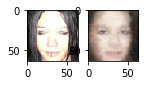

 88%|## |ETA:   0:00:59  Epoch: 14   Iter: 2699   Class Loss: 0.00   Loss: 0.02

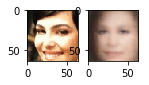

 91%|## |ETA:   0:00:44  Epoch: 14   Iter: 2799   Class Loss: 0.00   Loss: 0.02

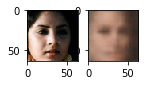

 94%|## |ETA:   0:00:29  Epoch: 14   Iter: 2899   Class Loss: 0.00   Loss: 0.02

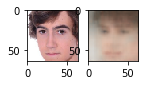

 98%|## |ETA:   0:00:09  Epoch: 14   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


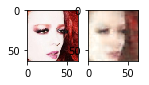

100%|###|Time:  0:08:43  Epoch: 14   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


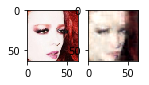

  3%|     |ETA:   0:09:00  Epoch: 15   Iter: 99   Class Loss: 0.00   Loss: 0.02

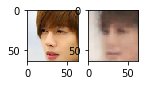

  6%|    |ETA:   0:08:23  Epoch: 15   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


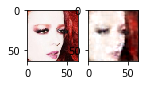

  9%|    |ETA:   0:07:52  Epoch: 15   Iter: 299   Class Loss: 0.00   Loss: 0.02

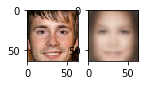

 13%|    |ETA:   0:07:44  Epoch: 15   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


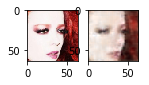

 16%|    |ETA:   0:07:12  Epoch: 15   Iter: 499   Class Loss: 0.00   Loss: 0.02

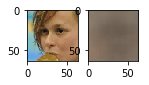

 19%|    |ETA:   0:06:54  Epoch: 15   Iter: 599   Class Loss: 0.00   Loss: 0.02

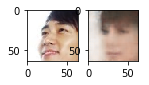

 22%|    |ETA:   0:06:53  Epoch: 15   Iter: 699   Class Loss: 0.00   Loss: 0.02

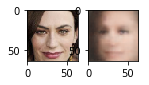

 26%|#   |ETA:   0:06:20  Epoch: 15   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


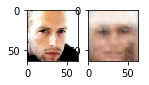

 29%|#   |ETA:   0:05:59  Epoch: 15   Iter: 899   Class Loss: 0.00   Loss: 0.02

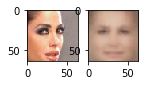

 32%|#   |ETA:   0:05:58  Epoch: 15   Iter: 999   Class Loss: 0.08   Loss: 0.10Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


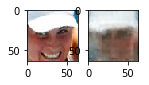

 36%|#  |ETA:   0:05:31  Epoch: 15   Iter: 1099   Class Loss: 0.00   Loss: 0.02

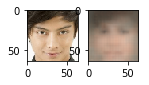

 39%|#  |ETA:   0:05:24  Epoch: 15   Iter: 1199   Class Loss: 0.01   Loss: 0.03

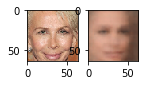

 42%|#  |ETA:   0:05:08  Epoch: 15   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


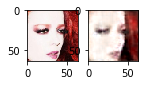

 45%|#  |ETA:   0:04:58  Epoch: 15   Iter: 1399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


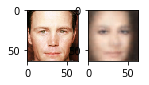

 49%|#  |ETA:   0:04:33  Epoch: 15   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


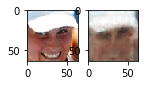

 52%|#  |ETA:   0:04:17  Epoch: 15   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


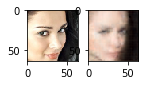

 55%|#  |ETA:   0:03:56  Epoch: 15   Iter: 1699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


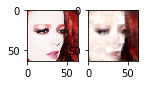

 58%|#  |ETA:   0:03:36  Epoch: 15   Iter: 1799   Class Loss: 0.00   Loss: 0.02

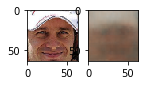

 62%|#  |ETA:   0:03:21  Epoch: 15   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


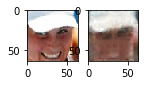

 65%|#  |ETA:   0:02:58  Epoch: 15   Iter: 1999   Class Loss: 0.00   Loss: 0.02

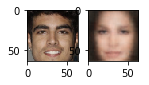

 68%|## |ETA:   0:02:43  Epoch: 15   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


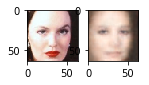

 72%|## |ETA:   0:02:22  Epoch: 15   Iter: 2199   Class Loss: 0.00   Loss: 0.02

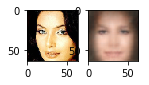

 75%|## |ETA:   0:02:10  Epoch: 15   Iter: 2299   Class Loss: 0.00   Loss: 0.03

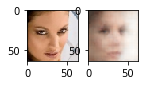

 78%|## |ETA:   0:01:53  Epoch: 15   Iter: 2399   Class Loss: 0.00   Loss: 0.02

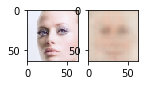

 81%|## |ETA:   0:01:33  Epoch: 15   Iter: 2499   Class Loss: 0.00   Loss: 0.03

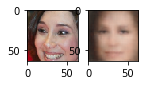

 85%|## |ETA:   0:01:21  Epoch: 15   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


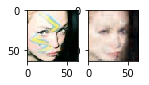

 88%|## |ETA:   0:01:01  Epoch: 15   Iter: 2699   Class Loss: 0.00   Loss: 0.02

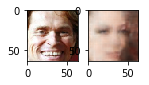

 91%|## |ETA:   0:00:44  Epoch: 15   Iter: 2799   Class Loss: 0.00   Loss: 0.02

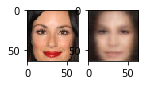

 94%|## |ETA:   0:00:25  Epoch: 15   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


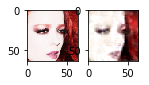

 98%|## |ETA:   0:00:09  Epoch: 15   Iter: 2999   Class Loss: 0.00   Loss: 0.03

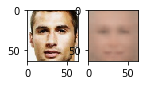

100%|###|Time:  0:08:48  Epoch: 15   Iter: 3052   Class Loss: 0.00   Loss: 0.03


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

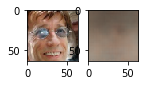

  3%|     |ETA:   0:08:27  Epoch: 16   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


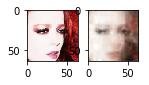

  6%|    |ETA:   0:08:10  Epoch: 16   Iter: 199   Class Loss: 0.00   Loss: 0.03

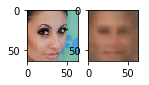

  9%|    |ETA:   0:07:41  Epoch: 16   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


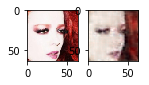

 13%|    |ETA:   0:07:37  Epoch: 16   Iter: 399   Class Loss: 0.00   Loss: 0.02

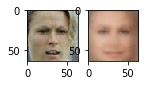

 16%|    |ETA:   0:07:30  Epoch: 16   Iter: 499   Class Loss: 0.00   Loss: 0.03

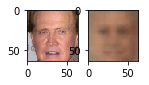

 19%|    |ETA:   0:07:06  Epoch: 16   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


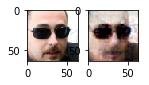

 22%|    |ETA:   0:06:45  Epoch: 16   Iter: 699   Class Loss: 0.01   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


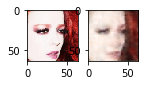

 26%|#   |ETA:   0:06:30  Epoch: 16   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


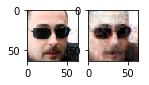

 29%|#   |ETA:   0:06:10  Epoch: 16   Iter: 899   Class Loss: 0.00   Loss: 0.03

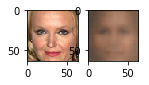

 32%|#   |ETA:   0:06:10  Epoch: 16   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


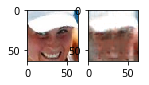

 36%|#  |ETA:   0:06:10  Epoch: 16   Iter: 1099   Class Loss: 0.00   Loss: 0.02

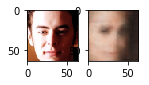

 39%|#  |ETA:   0:05:16  Epoch: 16   Iter: 1199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


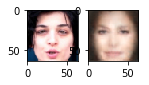

 42%|#  |ETA:   0:04:49  Epoch: 16   Iter: 1299   Class Loss: 0.00   Loss: 0.02

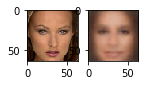

 45%|#  |ETA:   0:04:43  Epoch: 16   Iter: 1399   Class Loss: 0.01   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


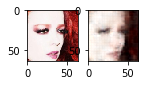

 49%|#  |ETA:   0:04:37  Epoch: 16   Iter: 1499   Class Loss: 0.00   Loss: 0.02

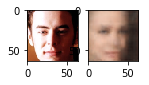

 52%|#  |ETA:   0:04:04  Epoch: 16   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


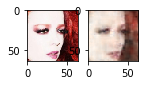

 55%|#  |ETA:   0:03:57  Epoch: 16   Iter: 1699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


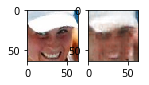

 58%|#  |ETA:   0:03:34  Epoch: 16   Iter: 1799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


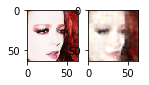

 62%|#  |ETA:   0:03:21  Epoch: 16   Iter: 1899   Class Loss: 0.00   Loss: 0.02

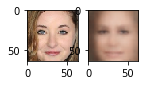

 65%|#  |ETA:   0:02:57  Epoch: 16   Iter: 1999   Class Loss: 0.00   Loss: 0.02

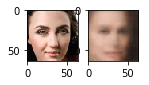

 68%|## |ETA:   0:02:46  Epoch: 16   Iter: 2099   Class Loss: 0.00   Loss: 0.02

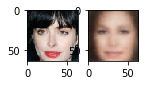

 72%|## |ETA:   0:02:33  Epoch: 16   Iter: 2199   Class Loss: 0.00   Loss: 0.03

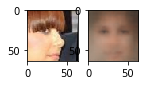

 75%|## |ETA:   0:02:14  Epoch: 16   Iter: 2299   Class Loss: 0.00   Loss: 0.02

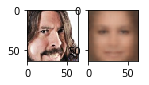

 78%|## |ETA:   0:01:52  Epoch: 16   Iter: 2399   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


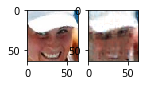

 81%|## |ETA:   0:01:34  Epoch: 16   Iter: 2499   Class Loss: 0.00   Loss: 0.02

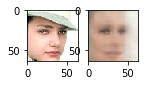

 85%|## |ETA:   0:01:16  Epoch: 16   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


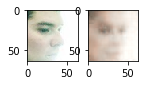

 88%|## |ETA:   0:00:54  Epoch: 16   Iter: 2699   Class Loss: 0.00   Loss: 0.02

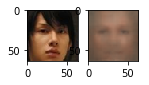

 91%|## |ETA:   0:00:42  Epoch: 16   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


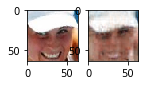

 94%|## |ETA:   0:00:25  Epoch: 16   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


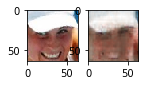

 98%|## |ETA:   0:00:09  Epoch: 16   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


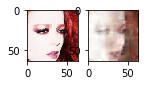

100%|###|Time:  0:08:48  Epoch: 16   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


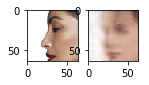

  3%|     |ETA:   0:07:47  Epoch: 17   Iter: 99   Class Loss: 0.00   Loss: 0.02

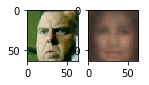

  6%|    |ETA:   0:19:46  Epoch: 17   Iter: 199   Class Loss: 0.00   Loss: 0.02

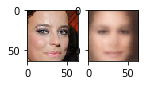

  9%|    |ETA:   0:08:11  Epoch: 17   Iter: 299   Class Loss: 0.00   Loss: 0.03

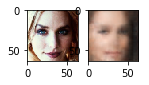

 13%|    |ETA:   0:07:48  Epoch: 17   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


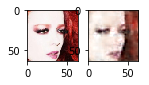

 16%|    |ETA:   0:07:22  Epoch: 17   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


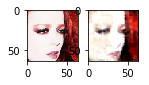

 19%|    |ETA:   0:07:14  Epoch: 17   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


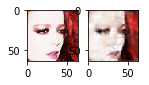

 22%|    |ETA:   0:06:54  Epoch: 17   Iter: 699   Class Loss: 0.00   Loss: 0.02

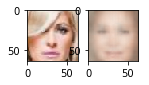

 26%|#   |ETA:   0:06:33  Epoch: 17   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


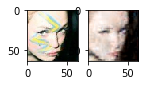

 29%|#   |ETA:   0:06:09  Epoch: 17   Iter: 899   Class Loss: 0.00   Loss: 0.02

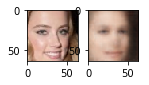

 32%|#   |ETA:   0:06:07  Epoch: 17   Iter: 999   Class Loss: 0.00   Loss: 0.02

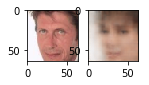

 36%|#  |ETA:   0:05:31  Epoch: 17   Iter: 1099   Class Loss: 0.00   Loss: 0.02

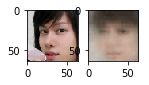

 39%|#  |ETA:   0:05:30  Epoch: 17   Iter: 1199   Class Loss: 0.00   Loss: 0.02

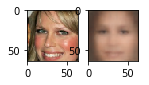

 42%|#  |ETA:   0:05:14  Epoch: 17   Iter: 1299   Class Loss: 0.00   Loss: 0.03

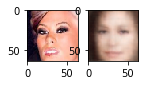

 45%|#  |ETA:   0:04:37  Epoch: 17   Iter: 1399   Class Loss: 0.00   Loss: 0.02

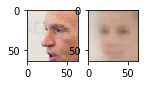

 49%|#  |ETA:   0:04:40  Epoch: 17   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


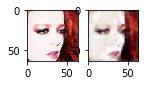

 52%|#  |ETA:   0:03:50  Epoch: 17   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


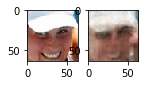

 55%|#  |ETA:   0:03:23  Epoch: 17   Iter: 1699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


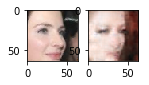

 58%|#  |ETA:   0:03:12  Epoch: 17   Iter: 1799   Class Loss: 0.00   Loss: 0.02

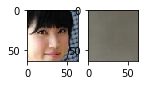

 62%|#  |ETA:   0:02:54  Epoch: 17   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


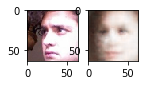

 65%|#  |ETA:   0:02:41  Epoch: 17   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


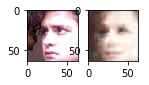

 68%|## |ETA:   0:02:24  Epoch: 17   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


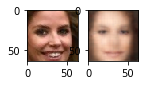

 72%|## |ETA:   0:02:14  Epoch: 17   Iter: 2199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


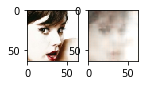

 75%|## |ETA:   0:01:56  Epoch: 17   Iter: 2299   Class Loss: 0.00   Loss: 0.02

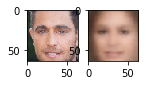

 78%|## |ETA:   0:01:41  Epoch: 17   Iter: 2399   Class Loss: 0.00   Loss: 0.02

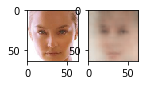

 81%|## |ETA:   0:01:27  Epoch: 17   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


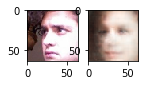

 85%|## |ETA:   0:01:16  Epoch: 17   Iter: 2599   Class Loss: 0.00   Loss: 0.02

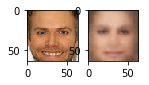

 88%|## |ETA:   0:01:00  Epoch: 17   Iter: 2699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


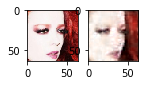

 91%|## |ETA:   0:00:43  Epoch: 17   Iter: 2799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


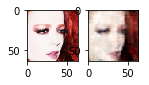

 94%|## |ETA:   0:00:26  Epoch: 17   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


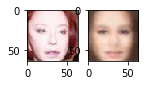

 98%|## |ETA:   0:00:09  Epoch: 17   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


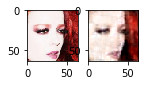

100%|###|Time:  0:08:36  Epoch: 17   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


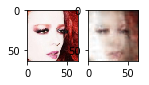

  3%|     |ETA:   0:07:47  Epoch: 18   Iter: 99   Class Loss: 0.00   Loss: 0.02

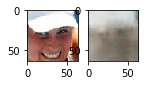

  6%|    |ETA:   0:07:39  Epoch: 18   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


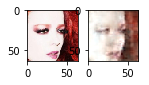

  9%|    |ETA:   0:07:51  Epoch: 18   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


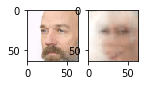

 13%|    |ETA:   0:07:26  Epoch: 18   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


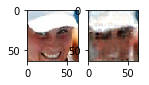

 16%|    |ETA:   0:07:23  Epoch: 18   Iter: 499   Class Loss: 0.00   Loss: 0.02

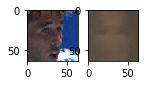

 19%|    |ETA:   0:07:05  Epoch: 18   Iter: 599   Class Loss: 0.01   Loss: 0.04

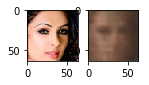

 22%|    |ETA:   0:06:36  Epoch: 18   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


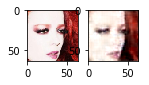

 26%|#   |ETA:   0:06:35  Epoch: 18   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


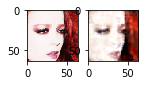

 29%|#   |ETA:   0:05:59  Epoch: 18   Iter: 899   Class Loss: 0.00   Loss: 0.02

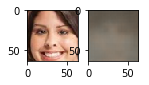

 32%|#   |ETA:   0:06:07  Epoch: 18   Iter: 999   Class Loss: 0.00   Loss: 0.02

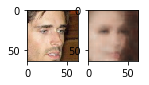

 36%|#  |ETA:   0:05:26  Epoch: 18   Iter: 1099   Class Loss: 0.00   Loss: 0.02

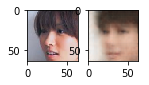

 39%|#  |ETA:   0:05:12  Epoch: 18   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


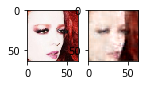

 42%|#  |ETA:   0:05:14  Epoch: 18   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


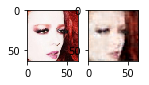

 45%|#  |ETA:   0:04:39  Epoch: 18   Iter: 1399   Class Loss: 0.00   Loss: 0.02

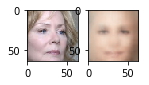

 49%|#  |ETA:   0:04:23  Epoch: 18   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


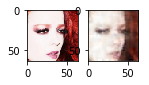

 52%|#  |ETA:   0:04:08  Epoch: 18   Iter: 1599   Class Loss: 0.00   Loss: 0.02

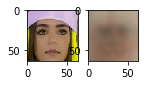

 55%|#  |ETA:   0:03:53  Epoch: 18   Iter: 1699   Class Loss: 0.00   Loss: 0.02

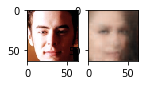

 58%|#  |ETA:   0:03:33  Epoch: 18   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


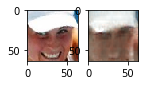

 62%|#  |ETA:   0:03:20  Epoch: 18   Iter: 1899   Class Loss: 0.00   Loss: 0.03

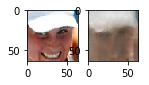

 65%|#  |ETA:   0:02:58  Epoch: 18   Iter: 1999   Class Loss: 0.00   Loss: 0.02

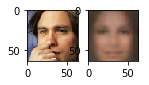

 68%|## |ETA:   0:02:43  Epoch: 18   Iter: 2099   Class Loss: 0.00   Loss: 0.02

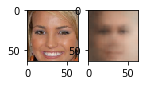

 72%|## |ETA:   0:02:33  Epoch: 18   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


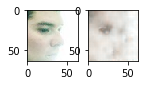

 75%|## |ETA:   0:02:13  Epoch: 18   Iter: 2299   Class Loss: 0.00   Loss: 0.02

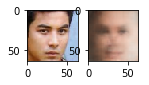

 78%|## |ETA:   0:01:55  Epoch: 18   Iter: 2399   Class Loss: 0.00   Loss: 0.02

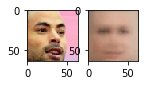

 81%|## |ETA:   0:03:58  Epoch: 18   Iter: 2499   Class Loss: 0.00   Loss: 0.02

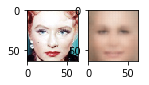

 85%|## |ETA:   0:01:19  Epoch: 18   Iter: 2599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


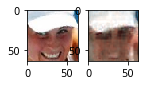

 88%|## |ETA:   0:00:58  Epoch: 18   Iter: 2699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


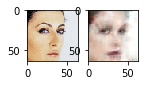

 91%|## |ETA:   0:00:49  Epoch: 18   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


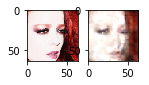

 94%|## |ETA:   0:00:28  Epoch: 18   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


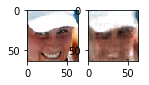

 98%|## |ETA:   0:00:10  Epoch: 18   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


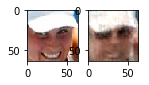

100%|###|Time:  0:08:58  Epoch: 18   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

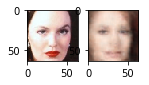

  3%|     |ETA:   0:10:16  Epoch: 19   Iter: 99   Class Loss: 0.01   Loss: 0.04Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


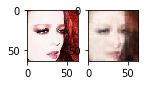

  6%|    |ETA:   0:09:20  Epoch: 19   Iter: 199   Class Loss: 0.00   Loss: 0.02

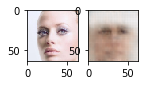

  9%|    |ETA:   0:08:14  Epoch: 19   Iter: 299   Class Loss: 0.01   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


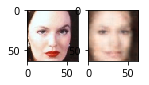

 13%|    |ETA:   0:07:33  Epoch: 19   Iter: 399   Class Loss: 0.00   Loss: 0.02

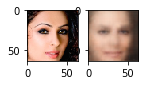

 16%|    |ETA:   0:08:07  Epoch: 19   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


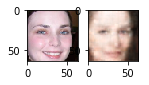

 19%|    |ETA:   0:08:44  Epoch: 19   Iter: 599   Class Loss: 0.00   Loss: 0.02

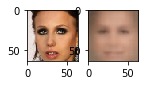

 22%|    |ETA:   0:06:14  Epoch: 19   Iter: 699   Class Loss: 0.00   Loss: 0.02

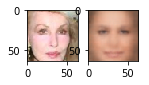

 26%|#   |ETA:   0:05:52  Epoch: 19   Iter: 799   Class Loss: 0.00   Loss: 0.02

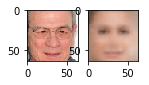

 29%|#   |ETA:   0:06:32  Epoch: 19   Iter: 899   Class Loss: 0.00   Loss: 0.02

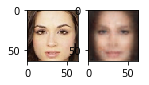

 32%|#   |ETA:   0:05:56  Epoch: 19   Iter: 999   Class Loss: 0.00   Loss: 0.02

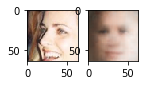

 36%|#  |ETA:   0:06:00  Epoch: 19   Iter: 1099   Class Loss: 0.00   Loss: 0.02

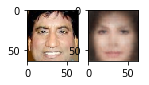

 39%|#  |ETA:   0:05:45  Epoch: 19   Iter: 1199   Class Loss: 0.00   Loss: 0.02

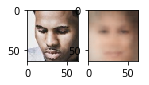

 42%|#  |ETA:   0:06:24  Epoch: 19   Iter: 1299   Class Loss: 0.00   Loss: 0.02

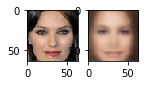

 45%|#  |ETA:   0:05:11  Epoch: 19   Iter: 1399   Class Loss: 0.00   Loss: 0.02

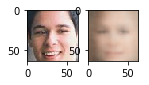

 49%|#  |ETA:   0:04:53  Epoch: 19   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


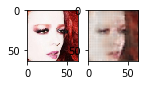

 52%|#  |ETA:   0:04:42  Epoch: 19   Iter: 1599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


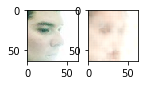

 55%|#  |ETA:   0:04:11  Epoch: 19   Iter: 1699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


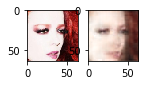

 58%|#  |ETA:   0:04:03  Epoch: 19   Iter: 1799   Class Loss: 0.00   Loss: 0.02

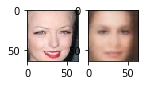

 62%|#  |ETA:   0:03:41  Epoch: 19   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


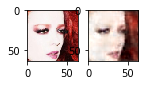

 65%|#  |ETA:   0:03:19  Epoch: 19   Iter: 1999   Class Loss: 0.00   Loss: 0.02

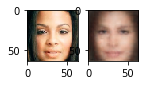

 68%|## |ETA:   0:02:41  Epoch: 19   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


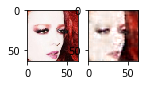

 72%|## |ETA:   0:02:30  Epoch: 19   Iter: 2199   Class Loss: 0.00   Loss: 0.02

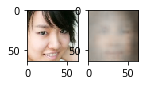

 75%|## |ETA:   0:02:22  Epoch: 19   Iter: 2299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


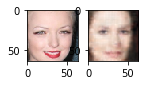

 78%|## |ETA:   0:01:52  Epoch: 19   Iter: 2399   Class Loss: 0.00   Loss: 0.02

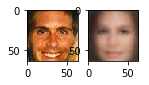

 81%|## |ETA:   0:01:39  Epoch: 19   Iter: 2499   Class Loss: 0.00   Loss: 0.02

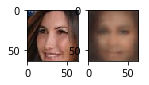

 85%|## |ETA:   0:01:16  Epoch: 19   Iter: 2599   Class Loss: 0.00   Loss: 0.02

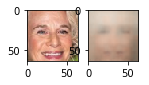

 88%|## |ETA:   0:01:01  Epoch: 19   Iter: 2699   Class Loss: 0.00   Loss: 0.02

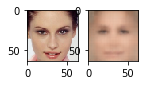

 91%|## |ETA:   0:00:44  Epoch: 19   Iter: 2799   Class Loss: 0.00   Loss: 0.02

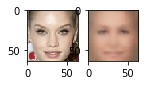

 94%|## |ETA:   0:00:25  Epoch: 19   Iter: 2899   Class Loss: 0.00   Loss: 0.02

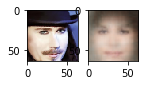

 98%|## |ETA:   0:00:09  Epoch: 19   Iter: 2999   Class Loss: 0.00   Loss: 0.03

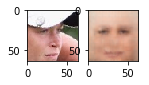

100%|###|Time:  0:09:26  Epoch: 19   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

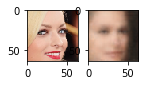

  3%|     |ETA:   0:07:31  Epoch: 20   Iter: 99   Class Loss: 0.00   Loss: 0.03

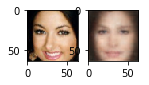

  6%|    |ETA:   0:08:12  Epoch: 20   Iter: 199   Class Loss: 0.00   Loss: 0.02

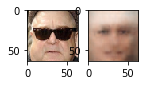

  9%|    |ETA:   0:07:30  Epoch: 20   Iter: 299   Class Loss: 0.00   Loss: 0.02

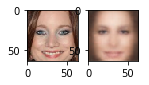

 13%|    |ETA:   0:07:33  Epoch: 20   Iter: 399   Class Loss: 0.00   Loss: 0.02

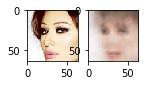

 16%|    |ETA:   0:07:20  Epoch: 20   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


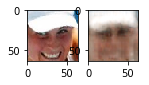

 19%|    |ETA:   0:06:58  Epoch: 20   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


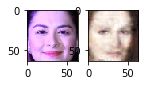

 22%|    |ETA:   0:06:45  Epoch: 20   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


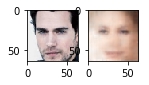

 26%|#   |ETA:   0:06:18  Epoch: 20   Iter: 799   Class Loss: 0.04   Loss: 0.07Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


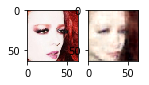

 29%|#   |ETA:   0:06:31  Epoch: 20   Iter: 899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


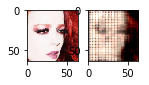

 32%|#   |ETA:   0:05:53  Epoch: 20   Iter: 999   Class Loss: 0.01   Loss: 0.03

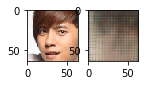

 36%|#  |ETA:   0:05:38  Epoch: 20   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


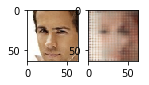

 39%|#  |ETA:   0:05:37  Epoch: 20   Iter: 1199   Class Loss: 0.00   Loss: 0.02

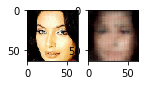

 42%|#  |ETA:   0:04:33  Epoch: 20   Iter: 1299   Class Loss: 0.00   Loss: 0.02

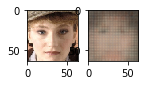

 45%|#  |ETA:   0:04:50  Epoch: 20   Iter: 1399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


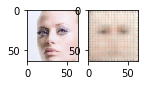

 49%|#  |ETA:   0:04:32  Epoch: 20   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


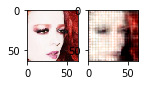

 52%|#  |ETA:   0:04:11  Epoch: 20   Iter: 1599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


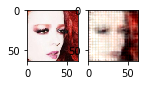

 55%|#  |ETA:   0:04:02  Epoch: 20   Iter: 1699   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


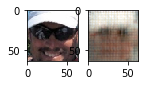

 58%|#  |ETA:   0:03:41  Epoch: 20   Iter: 1799   Class Loss: 0.03   Loss: 0.06

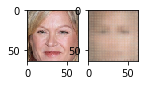

 62%|#  |ETA:   0:03:24  Epoch: 20   Iter: 1899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


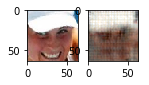

 65%|#  |ETA:   0:03:07  Epoch: 20   Iter: 1999   Class Loss: 0.00   Loss: 0.02

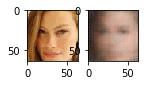

 68%|## |ETA:   0:02:47  Epoch: 20   Iter: 2099   Class Loss: 0.00   Loss: 0.02

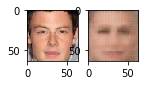

 72%|## |ETA:   0:02:27  Epoch: 20   Iter: 2199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


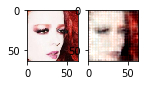

 75%|## |ETA:   0:02:13  Epoch: 20   Iter: 2299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


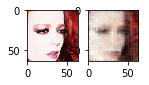

 78%|## |ETA:   0:01:53  Epoch: 20   Iter: 2399   Class Loss: 0.00   Loss: 0.02

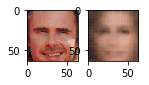

 81%|## |ETA:   0:01:38  Epoch: 20   Iter: 2499   Class Loss: 0.00   Loss: 0.02

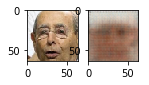

 85%|## |ETA:   0:01:25  Epoch: 20   Iter: 2599   Class Loss: 0.00   Loss: 0.02

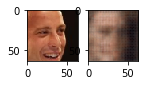

 88%|## |ETA:   0:00:56  Epoch: 20   Iter: 2699   Class Loss: 0.00   Loss: 0.03

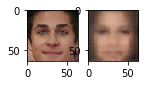

 91%|## |ETA:   0:00:40  Epoch: 20   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


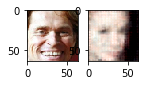

 94%|## |ETA:   0:00:25  Epoch: 20   Iter: 2899   Class Loss: 0.00   Loss: 0.02

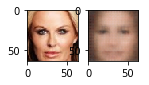

 98%|## |ETA:   0:00:08  Epoch: 20   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


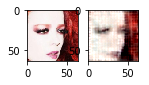

100%|###|Time:  0:08:50  Epoch: 20   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

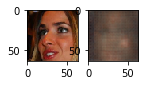

  3%|     |ETA:   0:08:06  Epoch: 21   Iter: 99   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


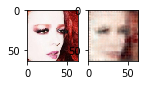

  6%|    |ETA:   0:07:18  Epoch: 21   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


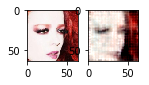

  9%|    |ETA:   0:07:01  Epoch: 21   Iter: 299   Class Loss: 0.00   Loss: 0.03

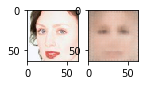

 13%|    |ETA:   0:07:29  Epoch: 21   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


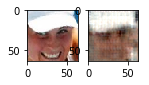

 16%|    |ETA:   0:06:41  Epoch: 21   Iter: 499   Class Loss: 0.03   Loss: 0.05Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


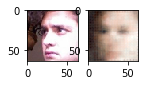

 19%|    |ETA:   0:06:38  Epoch: 21   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


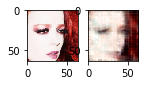

 22%|    |ETA:   0:06:28  Epoch: 21   Iter: 699   Class Loss: 0.00   Loss: 0.02

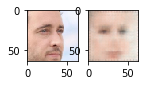

 26%|#   |ETA:   0:06:15  Epoch: 21   Iter: 799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


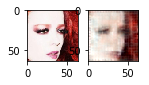

 29%|#   |ETA:   0:05:59  Epoch: 21   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


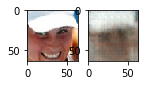

 32%|#   |ETA:   0:05:51  Epoch: 21   Iter: 999   Class Loss: 0.00   Loss: 0.02

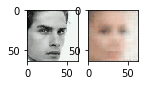

 36%|#  |ETA:   0:05:34  Epoch: 21   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


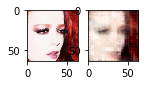

 39%|#  |ETA:   0:05:19  Epoch: 21   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


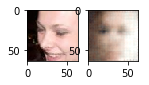

 42%|#  |ETA:   0:05:20  Epoch: 21   Iter: 1299   Class Loss: 0.00   Loss: 0.02

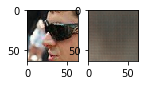

 45%|#  |ETA:   0:04:56  Epoch: 21   Iter: 1399   Class Loss: 0.00   Loss: 0.02

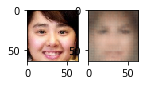

 49%|#  |ETA:   0:04:26  Epoch: 21   Iter: 1499   Class Loss: 0.00   Loss: 0.02

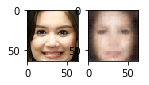

 52%|#  |ETA:   0:04:42  Epoch: 21   Iter: 1599   Class Loss: 0.00   Loss: 0.02

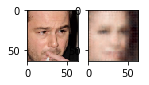

 55%|#  |ETA:   0:03:53  Epoch: 21   Iter: 1699   Class Loss: 0.00   Loss: 0.02

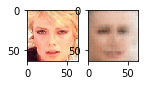

 58%|#  |ETA:   0:03:47  Epoch: 21   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


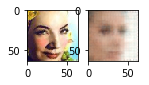

 62%|#  |ETA:   0:03:13  Epoch: 21   Iter: 1899   Class Loss: 0.00   Loss: 0.02

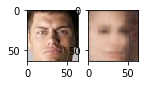

 65%|#  |ETA:   0:03:02  Epoch: 21   Iter: 1999   Class Loss: 0.00   Loss: 0.02

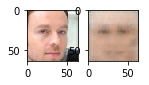

 68%|## |ETA:   0:02:42  Epoch: 21   Iter: 2099   Class Loss: 0.00   Loss: 0.02

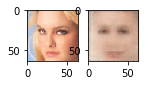

 72%|## |ETA:   0:02:26  Epoch: 21   Iter: 2199   Class Loss: 0.00   Loss: 0.02

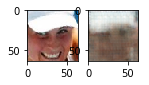

 75%|## |ETA:   0:02:08  Epoch: 21   Iter: 2299   Class Loss: 0.00   Loss: 0.03

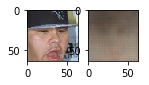

 78%|## |ETA:   0:01:57  Epoch: 21   Iter: 2399   Class Loss: 0.00   Loss: 0.02

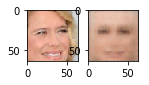

 81%|## |ETA:   0:01:34  Epoch: 21   Iter: 2499   Class Loss: 0.00   Loss: 0.02

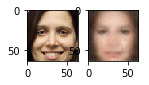

 85%|## |ETA:   0:01:18  Epoch: 21   Iter: 2599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


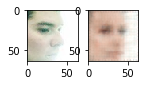

 88%|## |ETA:   0:01:00  Epoch: 21   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


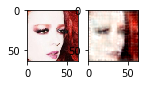

 91%|## |ETA:   0:00:46  Epoch: 21   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


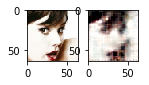

 94%|## |ETA:   0:00:27  Epoch: 21   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


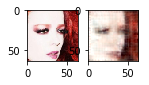

 98%|## |ETA:   0:00:09  Epoch: 21   Iter: 2999   Class Loss: 0.00   Loss: 0.02

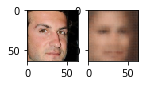

100%|###|Time:  0:08:42  Epoch: 21   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

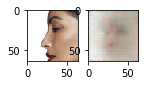

  3%|     |ETA:   0:07:13  Epoch: 22   Iter: 99   Class Loss: 0.00   Loss: 0.02

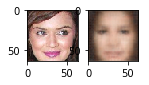

  6%|    |ETA:   0:06:50  Epoch: 22   Iter: 199   Class Loss: 0.00   Loss: 0.02

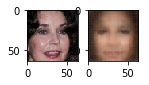

  9%|    |ETA:   0:07:06  Epoch: 22   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


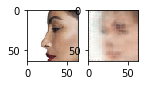

 13%|    |ETA:   0:07:15  Epoch: 22   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


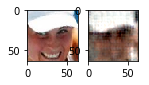

 16%|    |ETA:   0:07:32  Epoch: 22   Iter: 499   Class Loss: 0.00   Loss: 0.02

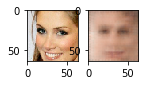

 19%|    |ETA:   0:06:50  Epoch: 22   Iter: 599   Class Loss: 0.00   Loss: 0.03

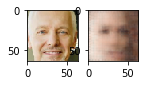

 22%|    |ETA:   0:06:49  Epoch: 22   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


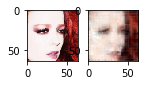

 26%|#   |ETA:   0:06:22  Epoch: 22   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


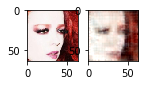

 29%|#   |ETA:   0:06:10  Epoch: 22   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


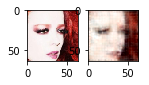

 32%|#   |ETA:   0:06:01  Epoch: 22   Iter: 999   Class Loss: 0.00   Loss: 0.02

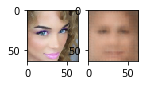

 36%|#  |ETA:   0:05:45  Epoch: 22   Iter: 1099   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


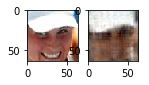

 39%|#  |ETA:   0:05:26  Epoch: 22   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


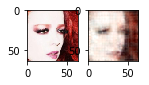

 42%|#  |ETA:   0:05:04  Epoch: 22   Iter: 1299   Class Loss: 0.00   Loss: 0.02

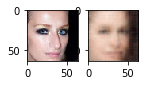

 45%|#  |ETA:   0:04:44  Epoch: 22   Iter: 1399   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


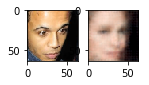

 49%|#  |ETA:   0:04:31  Epoch: 22   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


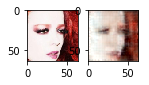

 52%|#  |ETA:   0:04:27  Epoch: 22   Iter: 1599   Class Loss: 0.01   Loss: 0.03

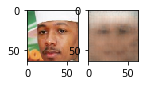

 55%|#  |ETA:   0:03:54  Epoch: 22   Iter: 1699   Class Loss: 0.00   Loss: 0.02

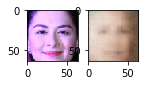

 58%|#  |ETA:   0:03:31  Epoch: 22   Iter: 1799   Class Loss: 0.00   Loss: 0.02

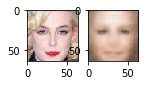

 62%|#  |ETA:   0:03:18  Epoch: 22   Iter: 1899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


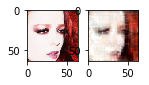

 65%|#  |ETA:   0:02:51  Epoch: 22   Iter: 1999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


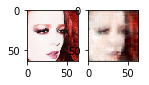

 68%|## |ETA:   0:02:49  Epoch: 22   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


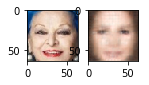

 72%|## |ETA:   0:02:40  Epoch: 22   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


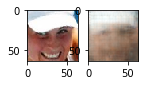

 75%|## |ETA:   0:02:11  Epoch: 22   Iter: 2299   Class Loss: 0.00   Loss: 0.02

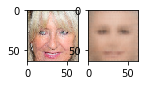

 78%|## |ETA:   0:01:54  Epoch: 22   Iter: 2399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


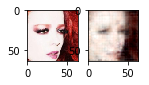

 81%|## |ETA:   0:01:35  Epoch: 22   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


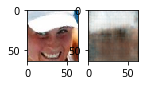

 85%|## |ETA:   0:01:18  Epoch: 22   Iter: 2599   Class Loss: 0.00   Loss: 0.02

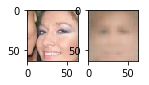

 88%|## |ETA:   0:01:02  Epoch: 22   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


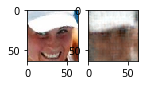

 91%|## |ETA:   0:00:43  Epoch: 22   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


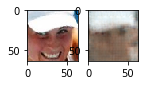

 94%|## |ETA:   0:00:26  Epoch: 22   Iter: 2899   Class Loss: 0.00   Loss: 0.02

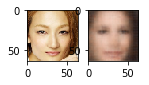

 98%|## |ETA:   0:00:09  Epoch: 22   Iter: 2999   Class Loss: 0.00   Loss: 0.02

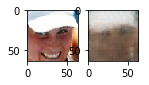

100%|###|Time:  0:08:43  Epoch: 22   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


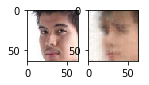

  3%|     |ETA:   0:07:46  Epoch: 23   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


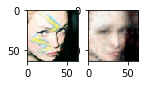

  6%|    |ETA:   0:07:28  Epoch: 23   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


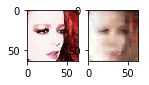

  9%|    |ETA:   0:07:29  Epoch: 23   Iter: 299   Class Loss: 0.00   Loss: 0.02

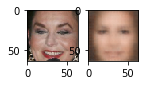

 13%|    |ETA:   0:06:56  Epoch: 23   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


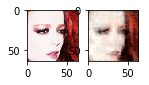

 16%|    |ETA:   0:06:40  Epoch: 23   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


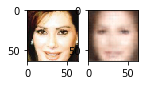

 19%|    |ETA:   0:06:18  Epoch: 23   Iter: 599   Class Loss: 0.00   Loss: 0.02

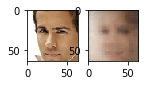

 22%|    |ETA:   0:06:12  Epoch: 23   Iter: 699   Class Loss: 0.00   Loss: 0.02

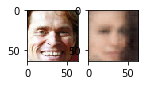

 26%|#   |ETA:   0:05:51  Epoch: 23   Iter: 799   Class Loss: 0.00   Loss: 0.02

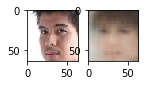

 29%|#   |ETA:   0:05:29  Epoch: 23   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


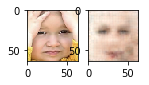

 32%|#   |ETA:   0:05:30  Epoch: 23   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


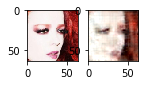

 36%|#  |ETA:   0:04:54  Epoch: 23   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


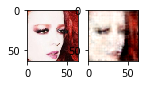

 39%|#  |ETA:   0:04:38  Epoch: 23   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


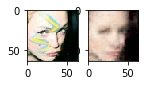

 42%|#  |ETA:   0:04:28  Epoch: 23   Iter: 1299   Class Loss: 0.00   Loss: 0.02

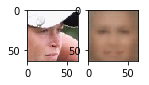

 45%|#  |ETA:   0:04:38  Epoch: 23   Iter: 1399   Class Loss: 0.00   Loss: 0.02

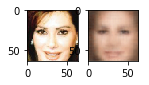

 49%|#  |ETA:   0:04:17  Epoch: 23   Iter: 1499   Class Loss: 0.00   Loss: 0.02

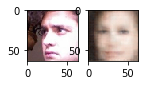

 52%|#  |ETA:   0:04:06  Epoch: 23   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


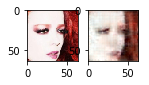

 55%|#  |ETA:   0:03:42  Epoch: 23   Iter: 1699   Class Loss: 0.00   Loss: 0.03

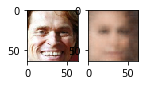

 58%|#  |ETA:   0:03:33  Epoch: 23   Iter: 1799   Class Loss: 0.00   Loss: 0.02

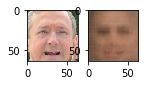

 62%|#  |ETA:   0:03:27  Epoch: 23   Iter: 1899   Class Loss: 0.00   Loss: 0.02

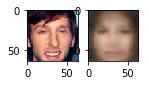

 65%|#  |ETA:   0:03:05  Epoch: 23   Iter: 1999   Class Loss: 0.00   Loss: 0.02

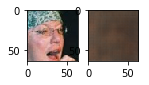

 68%|## |ETA:   0:02:44  Epoch: 23   Iter: 2099   Class Loss: 0.00   Loss: 0.02

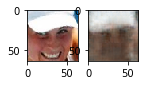

 72%|## |ETA:   0:02:26  Epoch: 23   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


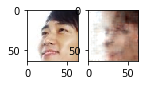

 75%|## |ETA:   0:02:06  Epoch: 23   Iter: 2299   Class Loss: 0.00   Loss: 0.02

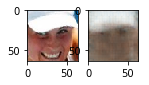

 78%|## |ETA:   0:01:51  Epoch: 23   Iter: 2399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


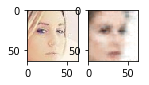

 81%|## |ETA:   0:01:36  Epoch: 23   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


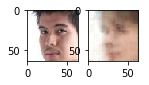

 85%|## |ETA:   0:01:17  Epoch: 23   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


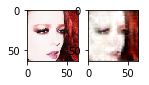

 88%|## |ETA:   0:01:01  Epoch: 23   Iter: 2699   Class Loss: 0.00   Loss: 0.03

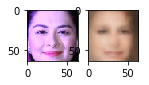

 91%|## |ETA:   0:00:43  Epoch: 23   Iter: 2799   Class Loss: 0.00   Loss: 0.02

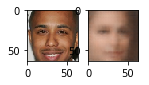

 94%|## |ETA:   0:00:25  Epoch: 23   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


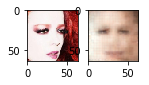

 98%|## |ETA:   0:00:09  Epoch: 23   Iter: 2999   Class Loss: 0.14   Loss: 0.17

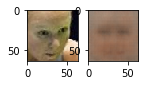

100%|###|Time:  0:08:22  Epoch: 23   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

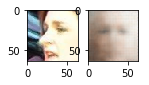

  3%|     |ETA:   0:08:18  Epoch: 24   Iter: 99   Class Loss: 0.00   Loss: 0.02

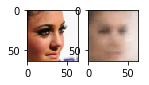

  6%|    |ETA:   0:08:00  Epoch: 24   Iter: 199   Class Loss: 0.00   Loss: 0.02

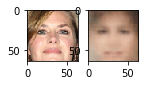

  9%|    |ETA:   0:07:57  Epoch: 24   Iter: 299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


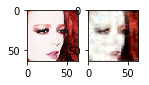

 13%|    |ETA:   0:07:30  Epoch: 24   Iter: 399   Class Loss: 0.00   Loss: 0.02

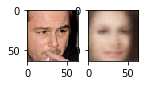

 16%|    |ETA:   0:07:15  Epoch: 24   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


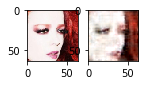

 19%|    |ETA:   0:06:50  Epoch: 24   Iter: 599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


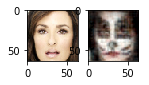

 22%|    |ETA:   0:06:51  Epoch: 24   Iter: 699   Class Loss: 0.00   Loss: 0.02

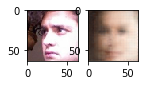

 26%|#   |ETA:   0:06:17  Epoch: 24   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


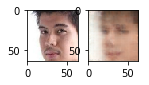

 29%|#   |ETA:   0:06:26  Epoch: 24   Iter: 899   Class Loss: 0.00   Loss: 0.02

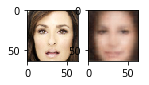

 32%|#   |ETA:   0:05:45  Epoch: 24   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


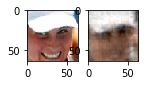

 36%|#  |ETA:   0:05:28  Epoch: 24   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


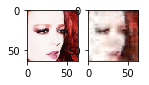

 39%|#  |ETA:   0:05:07  Epoch: 24   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


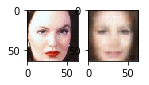

 42%|#  |ETA:   0:05:01  Epoch: 24   Iter: 1299   Class Loss: 0.00   Loss: 0.02

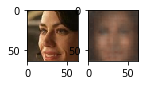

 45%|#  |ETA:   0:04:37  Epoch: 24   Iter: 1399   Class Loss: 0.00   Loss: 0.02

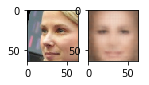

 49%|#  |ETA:   0:04:29  Epoch: 24   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


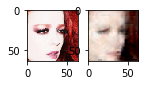

 52%|#  |ETA:   0:04:14  Epoch: 24   Iter: 1599   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


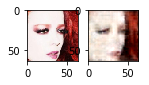

 55%|#  |ETA:   0:03:44  Epoch: 24   Iter: 1699   Class Loss: 0.00   Loss: 0.02

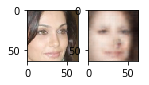

 58%|#  |ETA:   0:03:28  Epoch: 24   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


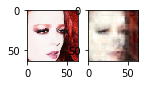

 62%|#  |ETA:   0:03:26  Epoch: 24   Iter: 1899   Class Loss: 0.00   Loss: 0.02

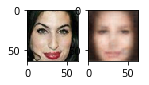

 65%|#  |ETA:   0:03:03  Epoch: 24   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


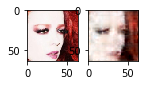

 68%|## |ETA:   0:02:45  Epoch: 24   Iter: 2099   Class Loss: 0.00   Loss: 0.02

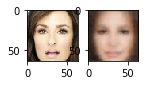

 72%|## |ETA:   0:02:27  Epoch: 24   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


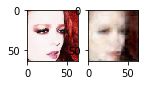

 75%|## |ETA:   0:02:07  Epoch: 24   Iter: 2299   Class Loss: 0.00   Loss: 0.02

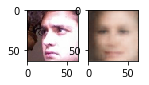

 78%|## |ETA:   0:01:48  Epoch: 24   Iter: 2399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


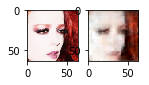

 81%|## |ETA:   0:01:33  Epoch: 24   Iter: 2499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


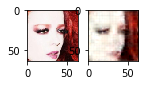

 85%|## |ETA:   0:01:16  Epoch: 24   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


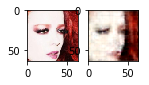

 88%|## |ETA:   0:01:00  Epoch: 24   Iter: 2699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


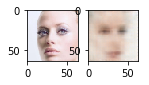

 91%|## |ETA:   0:00:41  Epoch: 24   Iter: 2799   Class Loss: 0.00   Loss: 0.03

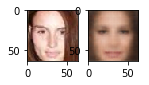

 94%|## |ETA:   0:00:25  Epoch: 24   Iter: 2899   Class Loss: 0.00   Loss: 0.02

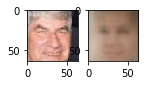

 98%|## |ETA:   0:00:08  Epoch: 24   Iter: 2999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


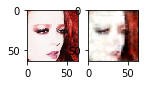

100%|###|Time:  0:08:41  Epoch: 24   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

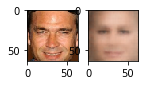

  3%|     |ETA:   0:08:15  Epoch: 25   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


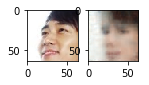

  6%|    |ETA:   0:08:05  Epoch: 25   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


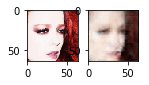

  9%|    |ETA:   0:07:47  Epoch: 25   Iter: 299   Class Loss: 0.00   Loss: 0.02

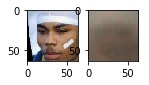

 13%|    |ETA:   0:07:38  Epoch: 25   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


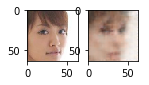

 16%|    |ETA:   0:07:06  Epoch: 25   Iter: 499   Class Loss: 0.00   Loss: 0.02

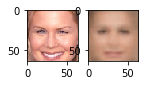

 19%|    |ETA:   0:06:54  Epoch: 25   Iter: 599   Class Loss: 0.00   Loss: 0.02

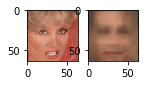

 22%|    |ETA:   0:06:36  Epoch: 25   Iter: 699   Class Loss: 0.00   Loss: 0.02

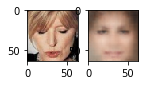

 26%|#   |ETA:   0:06:14  Epoch: 25   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


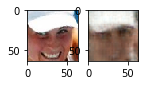

 29%|#   |ETA:   0:06:02  Epoch: 25   Iter: 899   Class Loss: 0.00   Loss: 0.02

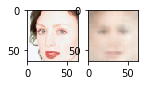

 32%|#   |ETA:   0:05:46  Epoch: 25   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


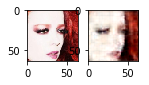

 36%|#  |ETA:   0:05:46  Epoch: 25   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


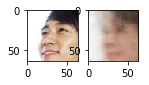

 39%|#  |ETA:   0:05:05  Epoch: 25   Iter: 1199   Class Loss: 0.00   Loss: 0.03

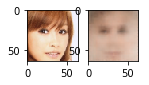

 42%|#  |ETA:   0:04:53  Epoch: 25   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


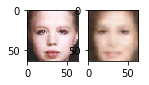

 45%|#  |ETA:   0:04:38  Epoch: 25   Iter: 1399   Class Loss: 0.00   Loss: 0.02

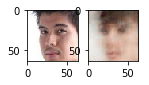

 49%|#  |ETA:   0:04:14  Epoch: 25   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


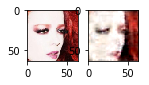

 52%|#  |ETA:   0:04:05  Epoch: 25   Iter: 1599   Class Loss: 0.00   Loss: 0.02

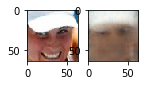

 55%|#  |ETA:   0:03:51  Epoch: 25   Iter: 1699   Class Loss: 0.00   Loss: 0.02

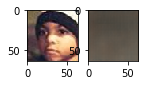

 58%|#  |ETA:   0:03:38  Epoch: 25   Iter: 1799   Class Loss: 0.00   Loss: 0.02

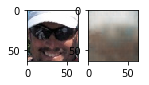

 62%|#  |ETA:   0:03:21  Epoch: 25   Iter: 1899   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


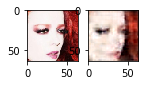

 65%|#  |ETA:   0:02:57  Epoch: 25   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


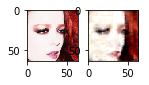

 68%|## |ETA:   0:02:39  Epoch: 25   Iter: 2099   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


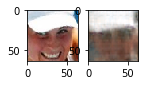

 72%|## |ETA:   0:02:25  Epoch: 25   Iter: 2199   Class Loss: 0.00   Loss: 0.02

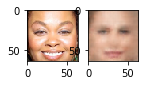

 75%|## |ETA:   0:02:05  Epoch: 25   Iter: 2299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


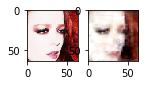

 78%|## |ETA:   0:01:49  Epoch: 25   Iter: 2399   Class Loss: 0.00   Loss: 0.02

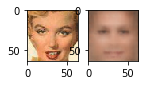

 81%|## |ETA:   0:01:40  Epoch: 25   Iter: 2499   Class Loss: 0.00   Loss: 0.03

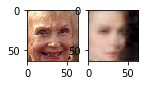

 85%|## |ETA:   0:01:17  Epoch: 25   Iter: 2599   Class Loss: 0.00   Loss: 0.02

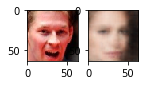

 88%|## |ETA:   0:00:59  Epoch: 25   Iter: 2699   Class Loss: 0.00   Loss: 0.02

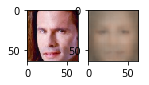

 91%|## |ETA:   0:00:42  Epoch: 25   Iter: 2799   Class Loss: 0.00   Loss: 0.02

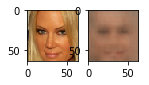

 94%|## |ETA:   0:00:27  Epoch: 25   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


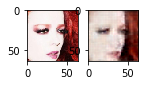

 98%|## |ETA:   0:00:09  Epoch: 25   Iter: 2999   Class Loss: 0.00   Loss: 0.03

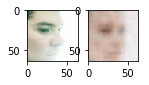

100%|###|Time:  0:08:42  Epoch: 25   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nanClipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


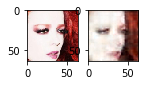

  3%|     |ETA:   0:08:47  Epoch: 26   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


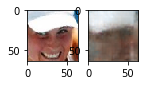

  6%|    |ETA:   0:07:53  Epoch: 26   Iter: 199   Class Loss: 0.00   Loss: 0.02

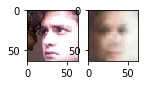

  9%|    |ETA:   0:07:54  Epoch: 26   Iter: 299   Class Loss: 0.00   Loss: 0.02

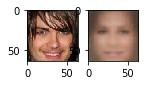

 13%|    |ETA:   0:07:26  Epoch: 26   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


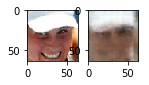

 16%|    |ETA:   0:07:21  Epoch: 26   Iter: 499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


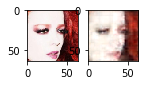

 19%|    |ETA:   0:06:49  Epoch: 26   Iter: 599   Class Loss: 0.00   Loss: 0.02

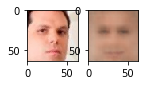

 22%|    |ETA:   0:06:41  Epoch: 26   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


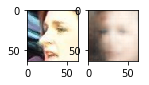

 26%|#   |ETA:   0:06:35  Epoch: 26   Iter: 799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


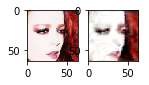

 29%|#   |ETA:   0:06:08  Epoch: 26   Iter: 899   Class Loss: 0.00   Loss: 0.03

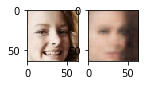

 32%|#   |ETA:   0:05:48  Epoch: 26   Iter: 999   Class Loss: 0.00   Loss: 0.02

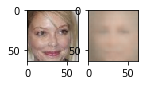

 36%|#  |ETA:   0:04:53  Epoch: 26   Iter: 1099   Class Loss: 0.00   Loss: 0.03

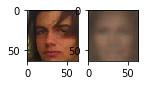

 39%|#  |ETA:   0:05:14  Epoch: 26   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


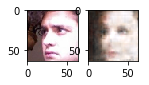

 42%|#  |ETA:   0:04:49  Epoch: 26   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


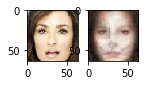

 45%|#  |ETA:   0:04:48  Epoch: 26   Iter: 1399   Class Loss: 0.00   Loss: 0.02

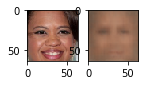

 49%|#  |ETA:   0:04:28  Epoch: 26   Iter: 1499   Class Loss: 0.00   Loss: 0.02

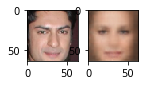

 52%|#  |ETA:   0:03:59  Epoch: 26   Iter: 1599   Class Loss: 0.00   Loss: 0.02

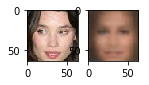

 55%|#  |ETA:   0:03:48  Epoch: 26   Iter: 1699   Class Loss: 0.00   Loss: 0.02

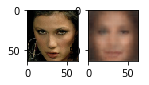

 58%|#  |ETA:   0:03:27  Epoch: 26   Iter: 1799   Class Loss: 0.00   Loss: 0.02

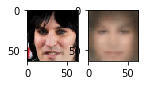

 62%|#  |ETA:   0:03:15  Epoch: 26   Iter: 1899   Class Loss: 0.00   Loss: 0.02

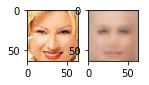

 65%|#  |ETA:   0:03:05  Epoch: 26   Iter: 1999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


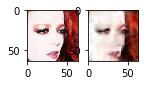

 68%|## |ETA:   0:02:42  Epoch: 26   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


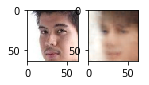

 72%|## |ETA:   0:02:29  Epoch: 26   Iter: 2199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


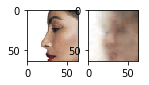

 75%|## |ETA:   0:02:07  Epoch: 26   Iter: 2299   Class Loss: 0.00   Loss: 0.02

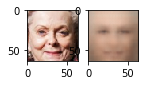

 78%|## |ETA:   0:01:52  Epoch: 26   Iter: 2399   Class Loss: 0.00   Loss: 0.02

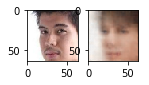

 81%|## |ETA:   0:01:33  Epoch: 26   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


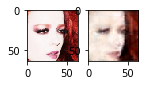

 85%|## |ETA:   0:01:24  Epoch: 26   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


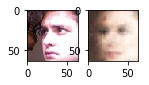

 88%|## |ETA:   0:01:02  Epoch: 26   Iter: 2699   Class Loss: 0.00   Loss: 0.02

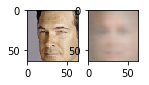

 91%|## |ETA:   0:00:44  Epoch: 26   Iter: 2799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


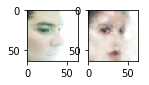

 94%|## |ETA:   0:00:25  Epoch: 26   Iter: 2899   Class Loss: 0.00   Loss: 0.02

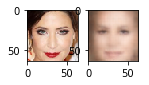

 98%|## |ETA:   0:00:09  Epoch: 26   Iter: 2999   Class Loss: 0.00   Loss: 0.02

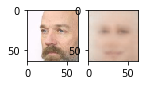

100%|###|Time:  0:08:41  Epoch: 26   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

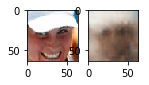

  3%|     |ETA:   0:08:17  Epoch: 27   Iter: 99   Class Loss: 0.00   Loss: 0.02

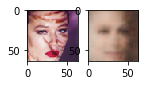

  6%|    |ETA:   0:08:04  Epoch: 27   Iter: 199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


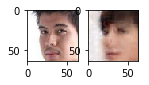

  9%|    |ETA:   0:07:48  Epoch: 27   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


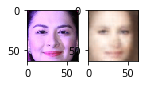

 13%|    |ETA:   0:07:23  Epoch: 27   Iter: 399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


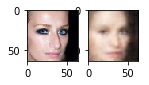

 16%|    |ETA:   0:07:20  Epoch: 27   Iter: 499   Class Loss: 0.01   Loss: 0.03

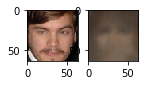

 19%|    |ETA:   0:06:57  Epoch: 27   Iter: 599   Class Loss: 0.00   Loss: 0.02

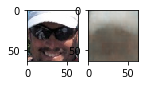

 22%|    |ETA:   0:06:42  Epoch: 27   Iter: 699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


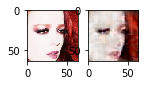

 26%|#   |ETA:   0:06:31  Epoch: 27   Iter: 799   Class Loss: 0.00   Loss: 0.02

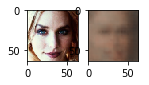

 29%|#   |ETA:   0:06:04  Epoch: 27   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


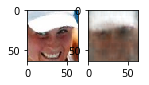

 32%|#   |ETA:   0:05:56  Epoch: 27   Iter: 999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


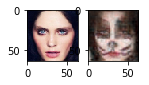

 36%|#  |ETA:   0:05:56  Epoch: 27   Iter: 1099   Class Loss: 0.00   Loss: 0.02

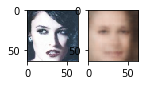

 39%|#  |ETA:   0:05:23  Epoch: 27   Iter: 1199   Class Loss: 0.00   Loss: 0.02

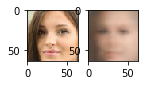

 42%|#  |ETA:   0:04:58  Epoch: 27   Iter: 1299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


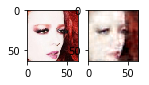

 45%|#  |ETA:   0:04:57  Epoch: 27   Iter: 1399   Class Loss: 0.01   Loss: 0.03

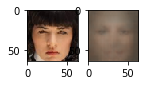

 49%|#  |ETA:   0:04:20  Epoch: 27   Iter: 1499   Class Loss: 0.00   Loss: 0.02

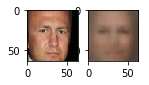

 52%|#  |ETA:   0:04:06  Epoch: 27   Iter: 1599   Class Loss: 0.00   Loss: 0.02

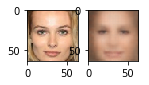

 55%|#  |ETA:   0:03:49  Epoch: 27   Iter: 1699   Class Loss: 0.00   Loss: 0.02

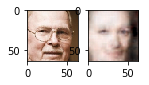

 58%|#  |ETA:   0:03:37  Epoch: 27   Iter: 1799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


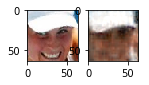

 62%|#  |ETA:   0:03:13  Epoch: 27   Iter: 1899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


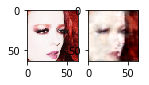

 65%|#  |ETA:   0:02:57  Epoch: 27   Iter: 1999   Class Loss: 0.00   Loss: 0.02

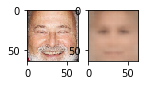

 68%|## |ETA:   0:02:52  Epoch: 27   Iter: 2099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


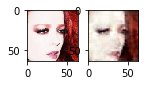

 72%|## |ETA:   0:02:23  Epoch: 27   Iter: 2199   Class Loss: 0.00   Loss: 0.02

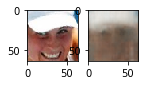

 75%|## |ETA:   0:02:07  Epoch: 27   Iter: 2299   Class Loss: 0.00   Loss: 0.02

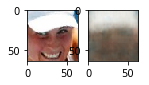

 78%|## |ETA:   0:01:55  Epoch: 27   Iter: 2399   Class Loss: 0.00   Loss: 0.02

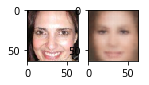

 81%|## |ETA:   0:01:34  Epoch: 27   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


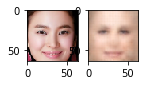

 85%|## |ETA:   0:01:23  Epoch: 27   Iter: 2599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


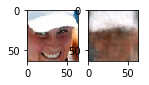

 88%|## |ETA:   0:01:01  Epoch: 27   Iter: 2699   Class Loss: 0.00   Loss: 0.03

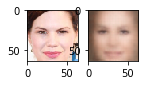

 91%|## |ETA:   0:00:43  Epoch: 27   Iter: 2799   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


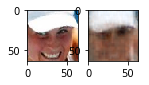

 94%|## |ETA:   0:00:25  Epoch: 27   Iter: 2899   Class Loss: 0.00   Loss: 0.02

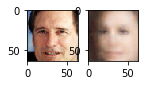

 98%|## |ETA:   0:00:09  Epoch: 27   Iter: 2999   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


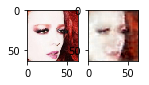

100%|###|Time:  0:08:47  Epoch: 27   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

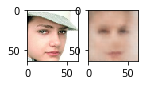

  3%|     |ETA:   0:08:34  Epoch: 28   Iter: 99   Class Loss: 0.04   Loss: 0.06Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


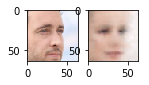

  6%|    |ETA:   0:08:01  Epoch: 28   Iter: 199   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


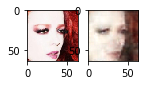

  9%|    |ETA:   0:07:48  Epoch: 28   Iter: 299   Class Loss: 0.00   Loss: 0.03

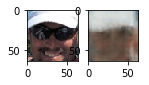

 13%|    |ETA:   0:07:41  Epoch: 28   Iter: 399   Class Loss: 0.00   Loss: 0.02

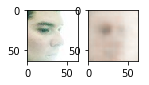

 16%|    |ETA:   0:07:20  Epoch: 28   Iter: 499   Class Loss: 0.00   Loss: 0.02

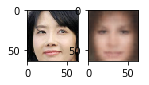

 19%|    |ETA:   0:06:51  Epoch: 28   Iter: 599   Class Loss: 0.00   Loss: 0.02

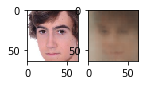

 22%|    |ETA:   0:06:31  Epoch: 28   Iter: 699   Class Loss: 0.00   Loss: 0.02

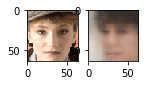

 26%|#   |ETA:   0:06:25  Epoch: 28   Iter: 799   Class Loss: 0.01   Loss: 0.03

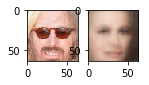

 29%|#   |ETA:   0:06:10  Epoch: 28   Iter: 899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


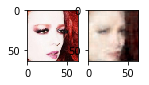

 32%|#   |ETA:   0:05:43  Epoch: 28   Iter: 999   Class Loss: 0.00   Loss: 0.02

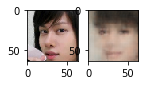

 36%|#  |ETA:   0:05:29  Epoch: 28   Iter: 1099   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


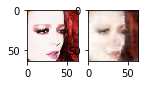

 39%|#  |ETA:   0:05:17  Epoch: 28   Iter: 1199   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


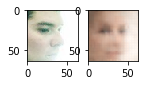

 42%|#  |ETA:   0:04:57  Epoch: 28   Iter: 1299   Class Loss: 0.02   Loss: 0.05

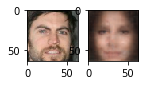

 45%|#  |ETA:   0:04:37  Epoch: 28   Iter: 1399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


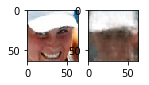

 49%|#  |ETA:   0:04:27  Epoch: 28   Iter: 1499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


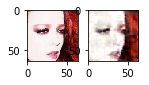

 52%|#  |ETA:   0:04:16  Epoch: 28   Iter: 1599   Class Loss: 0.00   Loss: 0.02

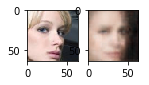

 55%|#  |ETA:   0:04:08  Epoch: 28   Iter: 1699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


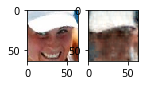

 58%|#  |ETA:   0:03:43  Epoch: 28   Iter: 1799   Class Loss: 0.00   Loss: 0.03

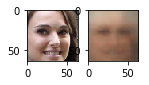

 62%|#  |ETA:   0:03:20  Epoch: 28   Iter: 1899   Class Loss: 0.00   Loss: 0.02

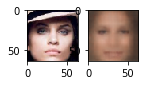

 65%|#  |ETA:   0:02:58  Epoch: 28   Iter: 1999   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


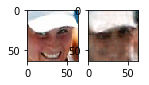

 68%|## |ETA:   0:02:40  Epoch: 28   Iter: 2099   Class Loss: 0.00   Loss: 0.03

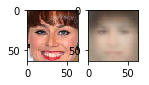

 72%|## |ETA:   0:02:33  Epoch: 28   Iter: 2199   Class Loss: 0.00   Loss: 0.02

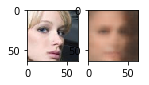

 75%|## |ETA:   0:02:06  Epoch: 28   Iter: 2299   Class Loss: 0.00   Loss: 0.02

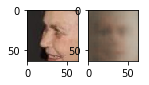

 78%|## |ETA:   0:01:53  Epoch: 28   Iter: 2399   Class Loss: 0.00   Loss: 0.02

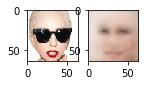

 81%|## |ETA:   0:01:35  Epoch: 28   Iter: 2499   Class Loss: 0.00   Loss: 0.02

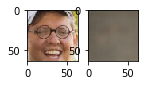

 85%|## |ETA:   0:01:19  Epoch: 28   Iter: 2599   Class Loss: 0.00   Loss: 0.02

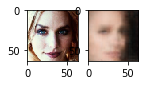

 88%|## |ETA:   0:00:59  Epoch: 28   Iter: 2699   Class Loss: 0.00   Loss: 0.02

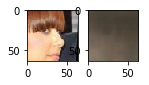

 91%|## |ETA:   0:00:43  Epoch: 28   Iter: 2799   Class Loss: 0.00   Loss: 0.02

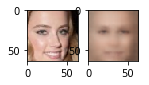

 94%|## |ETA:   0:00:27  Epoch: 28   Iter: 2899   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


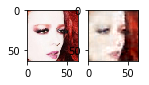

 98%|## |ETA:   0:00:09  Epoch: 28   Iter: 2999   Class Loss: 0.00   Loss: 0.03

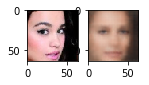

100%|###|Time:  0:08:44  Epoch: 28   Iter: 3052   Class Loss: 0.00   Loss: 0.02


recomputing sampling probs


N/A%|     |ETA:  --:--:--  Epoch: nan   Iter: nan   Class Loss: nan   Loss: nan

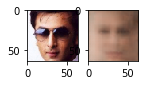

  3%|     |ETA:   0:08:24  Epoch: 29   Iter: 99   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


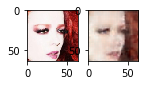

  6%|    |ETA:   0:08:10  Epoch: 29   Iter: 199   Class Loss: 0.00   Loss: 0.02

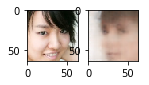

  9%|    |ETA:   0:07:51  Epoch: 29   Iter: 299   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


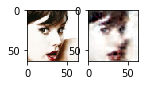

 13%|    |ETA:   0:07:37  Epoch: 29   Iter: 399   Class Loss: 0.00   Loss: 0.02

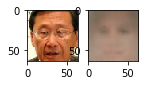

 16%|    |ETA:   0:07:25  Epoch: 29   Iter: 499   Class Loss: 0.00   Loss: 0.02

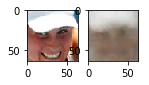

 19%|    |ETA:   0:06:52  Epoch: 29   Iter: 599   Class Loss: 0.00   Loss: 0.02

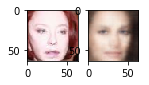

 22%|    |ETA:   0:06:36  Epoch: 29   Iter: 699   Class Loss: 0.00   Loss: 0.02

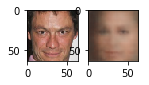

 26%|#   |ETA:   0:06:22  Epoch: 29   Iter: 799   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


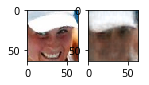

 29%|#   |ETA:   0:06:13  Epoch: 29   Iter: 899   Class Loss: 0.00   Loss: 0.03

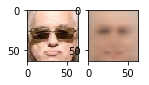

 32%|#   |ETA:   0:05:51  Epoch: 29   Iter: 999   Class Loss: 0.00   Loss: 0.02

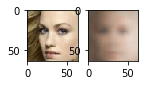

 36%|#  |ETA:   0:05:32  Epoch: 29   Iter: 1099   Class Loss: 0.01   Loss: 0.04

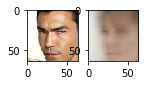

 39%|#  |ETA:   0:05:28  Epoch: 29   Iter: 1199   Class Loss: 0.00   Loss: 0.02

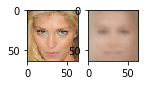

 42%|#  |ETA:   0:04:57  Epoch: 29   Iter: 1299   Class Loss: 0.00   Loss: 0.02

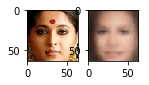

 45%|#  |ETA:   0:04:47  Epoch: 29   Iter: 1399   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


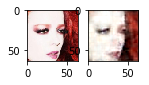

 49%|#  |ETA:   0:04:00  Epoch: 29   Iter: 1499   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


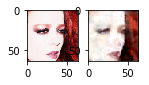

 52%|#  |ETA:   0:04:13  Epoch: 29   Iter: 1599   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


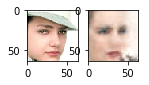

 55%|#  |ETA:   0:03:49  Epoch: 29   Iter: 1699   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


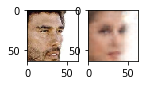

 58%|#  |ETA:   0:03:38  Epoch: 29   Iter: 1799   Class Loss: 0.00   Loss: 0.02

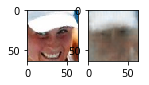

 62%|#  |ETA:   0:03:11  Epoch: 29   Iter: 1899   Class Loss: 0.00   Loss: 0.02

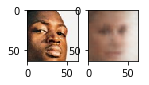

 65%|#  |ETA:   0:03:13  Epoch: 29   Iter: 1999   Class Loss: 0.00   Loss: 0.02

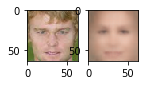

 68%|## |ETA:   0:02:48  Epoch: 29   Iter: 2099   Class Loss: 0.00   Loss: 0.02

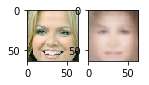

 72%|## |ETA:   0:02:29  Epoch: 29   Iter: 2199   Class Loss: 0.00   Loss: 0.02

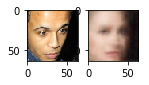

 75%|## |ETA:   0:02:07  Epoch: 29   Iter: 2299   Class Loss: 0.00   Loss: 0.03Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


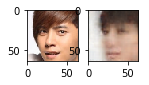

 78%|## |ETA:   0:01:52  Epoch: 29   Iter: 2399   Class Loss: 0.00   Loss: 0.02

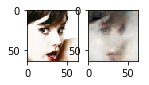

 81%|## |ETA:   0:01:39  Epoch: 29   Iter: 2499   Class Loss: 0.00   Loss: 0.02Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


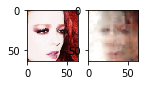

 85%|## |ETA:   0:01:18  Epoch: 29   Iter: 2599   Class Loss: 0.00   Loss: 0.02

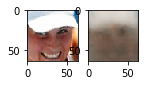

 88%|## |ETA:   0:01:03  Epoch: 29   Iter: 2699   Class Loss: 0.00   Loss: 0.02

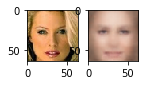

 91%|## |ETA:   0:00:44  Epoch: 29   Iter: 2799   Class Loss: 0.00   Loss: 0.02

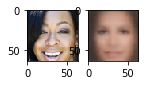

 94%|## |ETA:   0:00:25  Epoch: 29   Iter: 2899   Class Loss: 0.00   Loss: 0.02

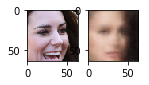

 98%|## |ETA:   0:00:08  Epoch: 29   Iter: 2999   Class Loss: 0.00   Loss: 0.02

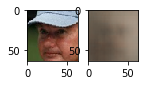

100%|###|Time:  0:08:42  Epoch: 29   Iter: 3052   Class Loss: 0.00   Loss: 0.03


In [260]:
#training time
batch_size = 36
epochs = 30
learning_rate = 1e-3

loss_history = []
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)

enable_debiasing = True
all_faces = loader.get_all_train_faces()

for epoch in range(epochs):
    custom_msg = custom_progress_text("Epoch: %(epoch).0f   Iter: %(idx).0f   Class Loss: %(class_loss)2.2f   Loss: %(loss)2.2f")
    bar = create_progress_bar(custom_msg)
    
    p_faces = None
    if enable_debiasing:
        p_faces = get_training_sample_probabilities(all_faces, encoder)
        
    for idx in bar(range(loader.get_train_size()//batch_size)):
        (x, y) = loader.get_batch(batch_size, p_pos=p_faces)
        x = tf.convert_to_tensor(x, dtype=tf.float32)
        y = tf.convert_to_tensor(y, dtype=tf.float32)
        
        with tf.GradientTape() as tape:
            y_logit, mu, logsigma, z = encoder(x)
            x_hat = decoder(z)
            loss, class_loss = debiasing_loss_function(x, x_hat, y, y_logit, mu, logsigma)
            
        grads = tape.gradient(loss, vae.variables)
        
        optimizer.apply_gradients(zip(grads, vae.variables), global_step=tf.train.get_or_create_global_step())
        
        #tracking losses
        class_loss_value = class_loss.numpy().mean()
        loss_value = loss.numpy().mean()
        loss_history.append((class_loss_value, loss_value))
        custom_msg.update_mapping(epoch=epoch, idx=idx, loss=loss_value, class_loss=class_loss_value)
        
        if idx%100 == 0: 
              plot_sample(x,y,vae)

In [262]:
accuracy_debiased = []
for skin_color in ['lighter', 'darker']:
    for gender in ['male', 'female']:
        accuracy_debiased.append(ppb.evaluate([encoder], gender, skin_color, output_idx=0, from_logit=True)[0])
        print("{} {}: {}".format(gender, skin_color, accuracy_debiased[-1]))

100% (97 of 97) |########################| Elapsed Time: 0:01:05 Time:  0:01:05
N/A% (0 of 72) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

male lighter: 0.845360824742268


100% (72 of 72) |########################| Elapsed Time: 0:00:47 Time:  0:00:47
N/A% (0 of 78) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

female lighter: 0.8333333333333334


100% (78 of 78) |########################| Elapsed Time: 0:00:50 Time:  0:00:50
N/A% (0 of 71) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

male darker: 0.7307692307692307


100% (71 of 71) |########################| Elapsed Time: 0:00:47 Time:  0:00:47


female darker: 0.8169014084507042


Text(0,0.5,'Accuracy')

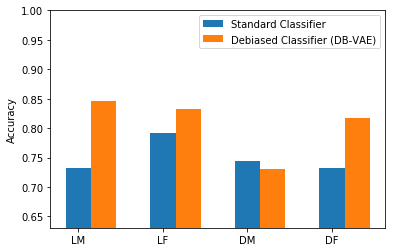

In [263]:
bar_width = 0.3
plt.bar(np.arange(4), standard_cnn_accuracy, width=bar_width)
plt.bar(np.arange(4)+bar_width, accuracy_debiased, width=bar_width)
plt.legend(('Standard Classifier','Debiased Classifier (DB-VAE)'))
plt.xticks(np.arange(4), ('LM', 'LF', 'DM', 'DF'))
plt.ylim(np.min([standard_cnn_accuracy,accuracy_debiased])-0.1,1)
plt.ylabel('Accuracy')